# Broadband Feed Data: First Impressions

In this notebook, I inspect data from the new broadband feeds deployed in South Africa. I focus the discussion in this note on two features that need to be removed in order for these feeds to carry out their Science mission. 

* RFI-like charge-pump spikes present in both __cross__ and more prominantly __auto__ correlations. 
* A 3-7 MHz reflection with a resonance at 55 MHz. This feature may be arising from power cables leading to the feed front-end or over-the-air reflections. 

I focus on data from 2458465 which seems ot have the maximal number of feeds operational (unlike 2458471 and previous nights). There are known issues with these data sets, most notably the antenna positions are known to be inaccurate. I don't explicitly use the antenna positioins in the uvData sets but do assume that the __pols__ and __antenna numbers__ can be taken as accurate. There is evidence that these can be trusted since the cross pols are generally smaller and antenna 14 is very low amplitude (it uses a passive balun with no amplification). 

## In this notebook, I inspect data from 2458465.

In [42]:
import numpy as np
from pyuvdata import UVData
from hera_qm import xrfi
import matplotlib.pyplot as plt
%matplotlib inline
import glob as glob
import re
import numpy.ma as ma
SPEED_OF_LIGHT = 299792458.
import numpy.fft as fft
import scipy.signal as signal
#import aipy.deconv as deconv
#from hera_qm import UVFlag
from pyuvdata import utils as pyuvutils
import copy
import scipy.integrate as integrate
import scipy.special as sp
import scipy.interpolate as interp

In [2]:
POL_NUM2STR_DICT = {1: 'pI', 2: 'pQ', 3: 'pU', 4: 'pV',
                    -1: 'rr', -2: 'll', -3: 'rl', -4: 'lr',
                    -5: 'xx', -6: 'yy', -7: 'xy', -8: 'yx'}

Get a sorted list of data files, including the diffed data sets.

In [3]:
files = glob.glob('2458465/*.HH.uvh5')
jds = []
for fname in files:
    fname_jd = fname.split('/')[-1]
    jd = float(re.findall('[0-9]{7}.[0-9]{5}',fname_jd)[0])
    jds.append(jd)
jds = np.array(jds)
#plt.scatter(jds-2458452,jds-2458452)
files = list(np.array(files)[np.argsort(jds)])
jds = jds[np.argsort(jds)]
#print(files)
#print(files)
#print(jds)
#jds_select = np.logical_and(jds-2458452<=.41797332,jds-2458452>=.35762505)
#jds=jds[jds_select]
#print(jds)
#files=np.array(files)[jds_select]
files = list(np.array(files)[np.argsort(jds)])
#get diff files
files_diff = []
for jd in jds:
    files_diff.append(glob.glob('2458465/*%s*.HH.diff.uvh5'%str(jd))[0])
#print(len(files))
#print(files_diff)

For the sake of agility, I'm only going to inspect 15 obervations in this notebook (hence the short times label). 

In [4]:
print(files[:15])

['2458465/zen.2458465.40598.HH.uvh5', '2458465/zen.2458465.40807.HH.uvh5', '2458465/zen.2458465.41016.HH.uvh5', '2458465/zen.2458465.41225.HH.uvh5', '2458465/zen.2458465.41433.HH.uvh5', '2458465/zen.2458465.41642.HH.uvh5', '2458465/zen.2458465.41851.HH.uvh5', '2458465/zen.2458465.42060.HH.uvh5', '2458465/zen.2458465.42269.HH.uvh5', '2458465/zen.2458465.42477.HH.uvh5', '2458465/zen.2458465.42686.HH.uvh5', '2458465/zen.2458465.42895.HH.uvh5', '2458465/zen.2458465.43104.HH.uvh5', '2458465/zen.2458465.43312.HH.uvh5', '2458465/zen.2458465.43521.HH.uvh5']


In [18]:
uvd = UVData()
uvd.read_uvh5(files[:15])

In [19]:
uvd_diff = UVData()
uvd_diff.read_uvh5(files_diff[:15])

In [20]:
#xrfi.xrfi_h1c_run(uvd,history='run xrfi on 2458465 first 15.',filename='2458465_short')

In [21]:
xrfi.flag_apply('2458465_short.flags.h5',uvd)
xrfi.flag_apply('2458465_short.flags.h5',uvd_diff)

## OK. Time for a linear delay-filter.

Here is a delay filtering function.

In [9]:
WMAT_CACHE = {}

In [140]:
def linear_filter(freqs,ydata,flags,bl_length,h_buffer=0.,filter_factor = 1e-3,weights='I',renormalize=True,zero_flags=True,output_domain='delay',taper='boxcar'):
    '''
    a linear delay filter that suppresses modes within the wedge by a factor of filter_factor. 
    freqs, nchan vector of frequencies
    ydata, nchan vector of complex data
    flags, nchan bool vector of flags
    '''
    nf = len(freqs)
    #print(nf)
    taper=signal.windows.get_window(taper,nf)
    taper/=taper.mean()
    #taper = np.diag(taper)
    taper_mat = np.diag(taper)
    #print(nf)
    #print(len(np.where(flags)[0]))
    if weights=='I':
        wmat = np.identity(nf)
        if zero_flags:
            wmat[:,flags]=0.
            wmat[flags,:]=0.
    elif weights == 'WTL':
        wkey = (nf,freqs[1]-freqs[0],bl_length,filter_factor,h_buffer,zero_flags)+tuple(np.where(flags)[0])
        if not wkey in WMAT_CACHE:
            fx,fy=np.meshgrid(freqs,freqs)
            tau_bl = bl_length/SPEED_OF_LIGHT + h_buffer
            ff = 2.*(fx-fy)*tau_bl
            cmat_fg = np.sinc(ff)
            cmat = cmat_fg+np.identity(len(freqs))*filter_factor
            #print(flags.shape)
            if zero_flags:
                cmat[:,flags]=0.
                cmat[flags,:]=0.
            #print(np.linalg.cond(cmat))
            wmat = np.linalg.pinv(cmat)*filter_factor
            WMAT_CACHE[wkey]=wmat
        else:
            wmat = WMAT_CACHE[wkey]
    output = ydata 
    output = np.dot(wmat,output)
    output = fft.fft(output * taper)
    if renormalize:
        igrid,jgrid = np.meshgrid(np.arange(-nf/2,nf/2),np.arange(-nf/2,nf/2))
        fftmat = np.exp(-2j*np.pi*igrid*jgrid/nf)
        #fftmat[flags,:]=0.
        #fftmat[:,flags]=0.
        mmat = np.dot(fftmat,np.dot(wmat,np.conj(fftmat).T))
        #print(np.linalg.cond(mmat))
        mmat_inv = np.linalg.pinv(mmat)
    else:
        mmat_inv = np.identity(nf)
    output=np.dot(mmat_inv,output)
    delays = np.arange(-nf/2,nf/2)*(freqs[1]-freqs[0])
    if output_domain=='frequency':
        output = fft.ifft(output)/taper
    #print(output.shape)
    return output,mmat_inv

In [142]:
def rms(x):
    return np.sqrt(np.mean(x**2.))

In [227]:
def lineplot_filter(uvd,uvd_d,ant1,ant2,pol,fmin=108e6,fmax=250e6,logscale=False,quantity='abs',h_buffer = 0.,fg_eps=1e-3,
                          renormalize=False,filter_only=False,weights='I',domain='delay',taper='boxcar', avg_label = '',
                          flag_across_time=True,mean_norm=False, y_translate = 0. , y_scale = 1., avg_color = 'k', show_diff = True,
                          zero_flags=True,use_max_bl=True,marker='',filtermethod='linear',ls='-',dish_diam=14.6, avg_only = False):
    #plt.close()
    #plt.figure()
    polstr=POL_NUM2STR_DICT[uvd.polarization_array[pol]]
    select_channels = np.where(np.logical_and(uvd.freq_array.squeeze()>=fmin,uvd.freq_array.squeeze()<=fmax))[0]
    if np.mod(len(uvd.freq_array.squeeze()[select_channels]),2)==1:
        select_channels=select_channels[:-1]
    #print(len(select_channels[select_channels]))
    #print(select_chans)
    uvd=uvd.select(freq_chans=select_channels,inplace=False)
    uvd_d = uvd_d.select(freq_chans=select_channels,inplace=False)
    nf=len(uvd.freq_array.squeeze())
    selection = uvd._key2inds((ant1, ant2))
    if len(selection[0])==0:
        selection = selection[1]
        a1 = ant2
        a2 = ant1
    elif len(selection[1])==0:
        selection = selection[0]
        a1 = ant1
        a2 = ant2
    if len(selection)>0:
        dvals=[]
        dvals_d = []
        dval_mean=np.zeros(nf,dtype=complex)
        dval_mean_d = np.zeros(nf,dtype=complex)
        mvals=[]
        times = uvd.time_array[selection]
        utimes=np.unique(times)
        dt=np.mean(np.diff(utimes))*24*60.*len(utimes)
        dfull = uvd.data_array[selection,:,:,pol]
        dfull_d = uvd_d.data_array[selection,:,:,pol]#/np.sqrt(2.)
        if mean_norm:
            dfull/=np.abs(dfull[np.invert(uvd.flag_array[selection,:,:,pol])]).mean()
            dfull_d/=np.abs(dfull[np.invert(uvd.flag_array[selection,:,:,pol])]).mean()
        if use_max_bl:
            b = np.linalg.norm(uvd.uvw_array[selection,:],axis=1).max()+dish_diam
        #for every time
        if flag_across_time:
            f=np.any(uvd.flag_array[selection,:,:,pol],axis=0).squeeze()
        for tnum,tval in enumerate(times):
            #filter 
            d=dfull[tnum,0,:]
            dd=dfull_d[tnum,0,:]
            if not flag_across_time:
                f=uvd.flag_array[selection,:,:,pol][tnum,0,:].squeeze()
            if not use_max_bl:
                b = np.linalg.norm(uvd.uvw_array[selection,:][tnum])+dish_diam
            if a1 == ant2 and a2 == ant1:
                d = np.conj(d)
                dd = np.conj(dd)
            #print('data rms')
            #print(rms(d))
            #print('noise rms')
            #print(rms(dd))
            if filtermethod=='linear':
                lv,mv=linear_filter(uvd.freq_array.squeeze(),
                                           d,
                                           f,
                                           b,zero_flags=zero_flags,
                                           h_buffer = h_buffer,output_domain=domain,
                                           filter_factor = fg_eps,weights=weights,renormalize=renormalize,taper=taper)
                lvd,mvd=linear_filter(uvd.freq_array.squeeze(),
                                           dd,
                                           f,
                                           b,zero_flags=zero_flags,
                                           h_buffer = h_buffer,output_domain=domain,
                                           filter_factor = fg_eps,weights=weights,renormalize=renormalize,taper=taper)
            elif filtermethod=='clean':
                dkernel = np.ones(len(d),dtype=complex)
                dkernel[f]=0.
                lv = deconv.clean(im=d,ker=dkernel,tol=1e-3,stop_if_div=False,verbose=False)[1]['res']
                lv,mv=linear_filter(uvd.freq_array.squeeze(),
                                    lv,
                                    f, 
                                    b,weights='I',zero_flags=zero_flags,taper=taper,renormalize=False)
                lvd,mvd=linear_filter(uvd.freq_array.squeeze(),
                                           dd,
                                           f,
                                           b,zero_flags=zero_flags,
                                           h_buffer = h_buffer,output_domain=domain,
                                           filter_factor = fg_eps,weights='I',renormalize=renormalize,taper=taper)
            
            #print(np.mean(lv))
            #print(np.mean(lvd))
            dvals.append(lv)
            dval_mean+=lv
            dval_mean_d+=lvd
            mvals.append(mv)
        dvals = np.array(dvals) 
        dval_mean/=len(dvals)
        dval_mean_d/=len(dvals)
        #print('filtered data rms')
        #print(rms(dval_mean))
        #print('filtered data rms')
        #print(rms(dval_mean_d))
        #print(dvals.shape)
        #print(nf)
        #compute noise level in each channel across time
        noise_level = np.sqrt(np.mean((np.std(dvals.real,axis=0)**2.+np.std(dvals.imag,axis=0)**2.)))
        #print(noise_level.shape)
        #print(noise_level)
        if quantity == 'abs':
            dvals = np.abs(dvals)
            dval_mean=np.abs(dval_mean)
            dval_mean_d=np.abs(dval_mean_d)
        if quantity == 'real':
            dvals = np.real(dvals)    
            dval_mean=np.real(dval_mean)
            dval_mean_d=np.real(dval_mean_d)
        if quantity == 'imag':
            dvals = np.imag(dvals)    
            dval_mean=np.imag(dval_mean)
            dval_mean_d=np.imag(dval_mean_d)
        if quantity == 'phase':
            dvals = np.angle(dvals)  
            dval_mean=np.angle(dval_mean)
            dval_mean_d=np.angle(dval_mean_d)
        #if logscale:
        #    dvals = np.log10((dvals))
        #print(dvals.shape)
        freqs = uvd.freq_array.squeeze()
        delays = fft.fftshift(fft.fftfreq(len(freqs),freqs[1]-freqs[0])*1e9)
        if domain == 'frequency':
            if not avg_only:
                for tnum,t in enumerate(times):
                    plt.plot(freqs/1e6,y_scale * dvals[tnum,:] + y_translate,ls=ls,marker=marker)
            plt.xlabel('$\\nu$ (MHz)')
            plt.plot(freqs/1e6,y_scale * dval_mean + y_translate,color=avg_color,lw=3,ls=ls,marker=marker, label = avg_label)
            if show_diff:
                plt.plot(freqs/1e6,y_scale * dval_mean_d + y_translate,color=avg_color,lw=1,ls='-', label = avg_label + ', diff')
        elif domain == 'delay':
            if not avg_only:
                for tnum,t in enumerate(times):
                    plt.plot(delays,y_scale * fft.fftshift(dvals[tnum,:]) + y_translate)
            plt.xlabel('$\\tau$ (ns)')
            #plt.axvline(-b/SPEED_OF_LIGHT*1e9,color='grey',lw=4,ls='-')
            #plt.axvline(b/SPEED_OF_LIGHT*1e9,color='grey',lw=4,ls='-')
            plt.axvline(-b/SPEED_OF_LIGHT*1e9,color=avg_color,lw=2,ls='--')
            plt.axvline(b/SPEED_OF_LIGHT*1e9,color=avg_color,lw=2,ls='--')    
            plt.plot(delays,y_scale * fft.fftshift(dval_mean) + y_translate,color=avg_color,lw=3,ls=ls,label = avg_label)
            if show_diff:
                plt.plot(delays,y_scale * fft.fftshift(dval_mean_d) + y_translate,color=avg_color,lw=1,ls='-', label = avg_label + ', diff')
        #if domain == 'delay':
        #    plt.axhline(noise_level,ls=':',color='grey',lw=3)
        #    plt.axhline(noise_level/np.sqrt(dvals.shape[0]),ls=':',color='k',lw=3)
        if logscale:
            plt.yscale('log')
        #plt.ylabel('JD')
        plt.ylabel('Ant %d x Ant %d %s %s\n DTime=%d minutes, b = %.1f m'%(ant1,ant2,polstr,quantity,dt,b))
        return mvals
    else:
        print('No data selected! for ant %d x ant %d %s'%(ant1,ant2,polstr))

Here is a list of 20 meter spacings organized by antenna. 


* 0: 0-13, 
* 1: 1-14, 1-25
* 12: 12-26,
* 13: 0-13
* 14: 1-14, 14-25
* 25:  1-25, 14-25
* 26: 12-26

Antennas 1, 14, and 25 have twice as many 20 meter spacings. Lets see if 1 and 25 have particularly bad autocorrelation stucture.

## A comprehensive look at reflections in low-band Autocorrelations (XX).

I now inspect the autocorrelation spectra in the frequency and delay domains. In the left hand panel of each of the below plots, I show the unfiltered (solid line) and unfiltered (dashed, dotted, dashed-dotted lines) frequency domain autocorrelations. Different line-styles for the frequency domain auto-correlations indicate different levels of filtered ($10^{-3}$, $10^{-5}$, $10^{-7}$). In the middle plot, I show the __unfiltered__ autocorrelation in the delay domain and in the far right I show the filtered delay domain autocorrelation. Detailed inspection yields that not all antennas have the same delays associated with their lobes. Here is an approximate list.

The peaks in the unfiltered and filtered autocorrelations do not always line up and its likely that periodic structure from unflagged RFI spikes is contaminating these observations. 

* __Ant 0__: 125 ns, 250 ns, 350 ns, 450 ns
* __Ant 1__: 150 ns, 300 ns, 450 ns
* __Ant 12__: 150 ns, 350 ns, 500 ns
* __Ant 13__: 125 ns, 300 ns, 400 ns
* __Ant 25__: 150 ns, 300 ns, 450 ns
* __Ant 26__: 150 ns, 275 ns, 400 ns

I decidede not to focus to much on the high band since the leading order structure in the high band cross correlations are the charge spikes and its hard to see anything with those. I will however inspect the charge spikes in the frequency domain below to compare with featuers I'm seeing in the cross correlations.


__It is possible that the extended large-delay structure is caused by side-lobes of the lower delay super-horizion structure. One way to figure this out is to adjust the delay filter width and see how the high delay contamination responds (consider moving the filter out to 300 ns!__

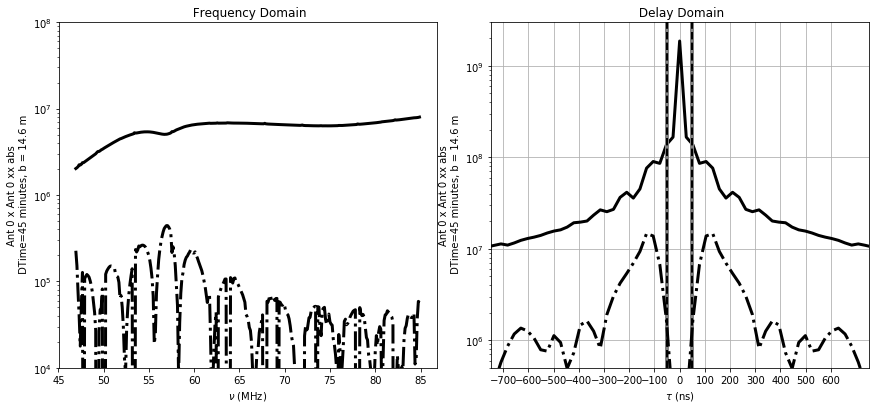

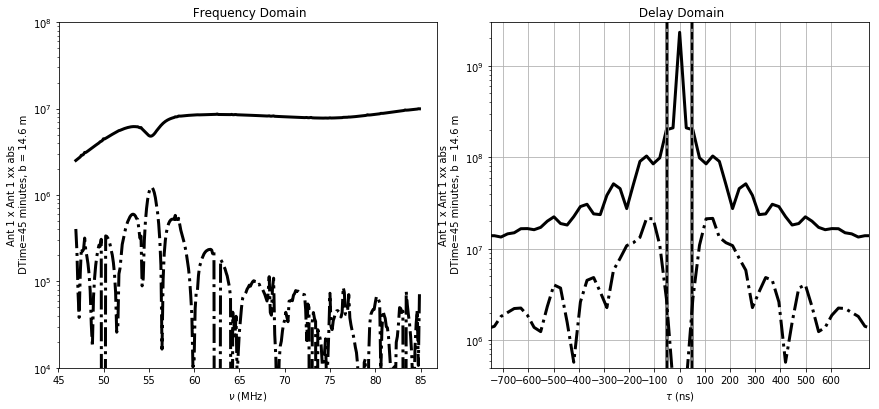

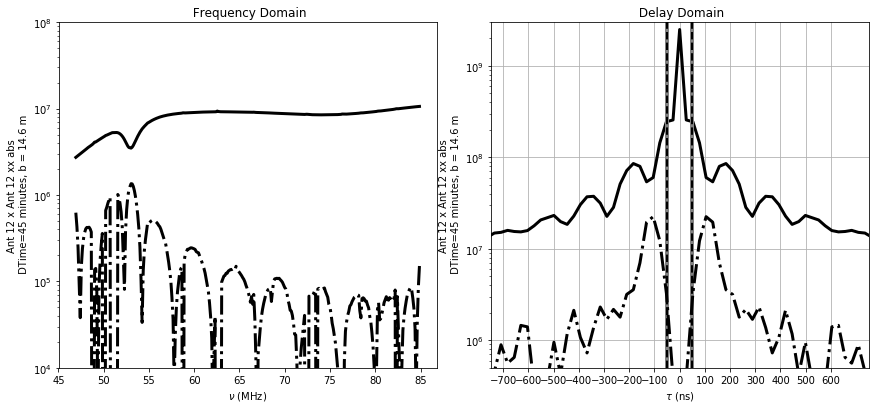

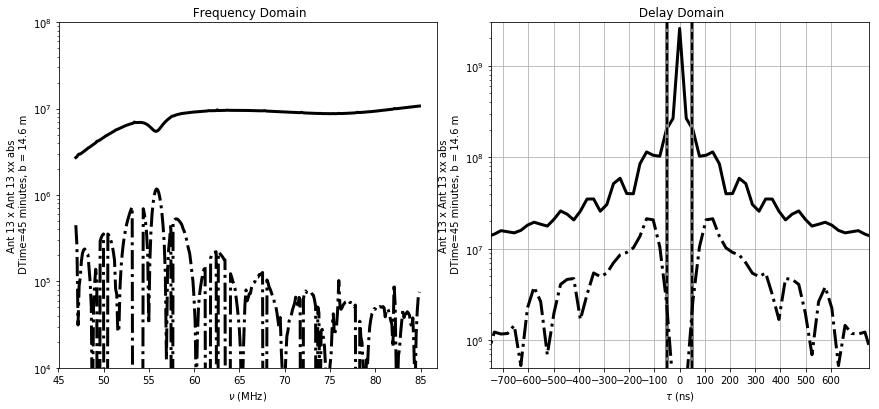

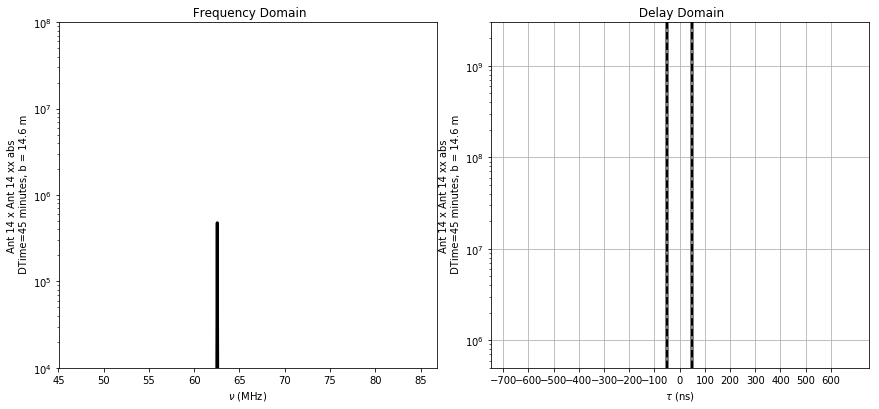

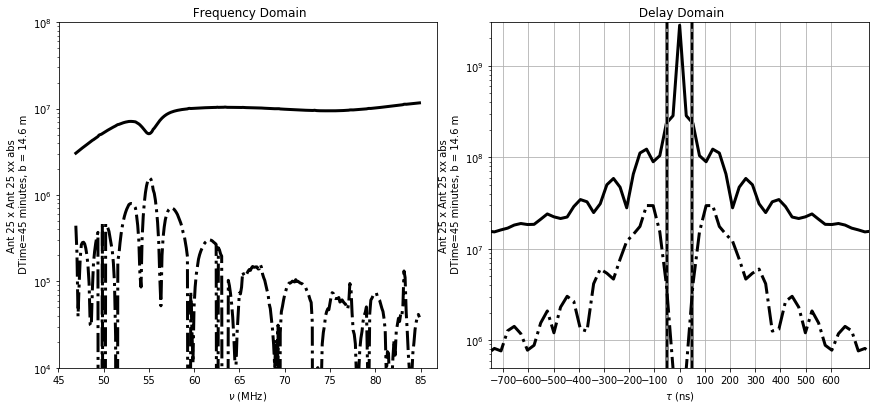

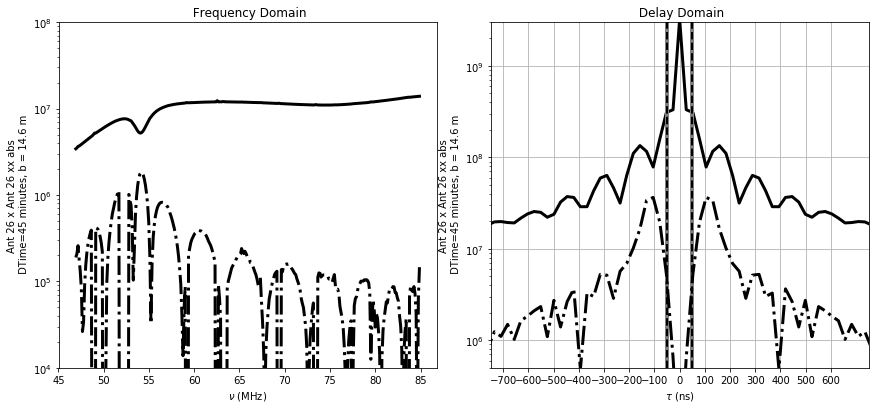

In [155]:
for antnum in np.unique(uvd.ant_1_array):
    for polnum in range(1):
        fig = plt.figure()
        axarr = [fig.add_axes([.1,.1,.35,.8]), fig.add_axes([.5,.1,.35,.8])]
        plt.sca(axarr[0])
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='I',
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=False, avg_only=True)
        
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_only=True,
                              taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-5,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-7,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '-.')
        
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-9,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '-.')
        
        plt.title(' Frequency Domain')
        plt.ylim(1e4,1e8)
        plt.sca(axarr[1])
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='I',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=False)
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '--')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = ':', fg_eps = 1e-5)
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '-.', fg_eps = 1e-7)
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                      taper='blackmanharris',domain='delay',quantity='abs',zero_flags=True, ls = '-.', fg_eps = 1e-9)
        
        plt.title(' Delay Domain')
        plt.ylim(5e5,3e9)
        plt.xlim(-750,750)
        plt.xticks(np.arange(-700,700,100))
        plt.grid()
        plt.gcf().set_size_inches(15,6)
        #plt.ylim(0,1.75)
        plt.show()


## Test the code on idealized data with no super-horizon contamination. 

Are the nasty ripples left over after filtering an artifact of the code/filtering procedure? I test this by generating mock data corresponding to the visibility of a gaussian point-source sky observed by a 14.6 meter dish and 0 meter baseline (autocorrelation).

I draw visibilities from the following covariance: 

\begin{equation}
C_{ij}^{pt}= \sigma_s^2 \int \frac{d \Omega d\nu d \nu^\prime}{\sin \theta} \Phi_i(\nu) \Phi_j(\nu^\prime) A(\hat{s},\nu) A^*(\hat{s},\nu^\prime) e^{-2 \pi I b \cdot \hat{s} (\nu - \nu^\prime)/c} e^{- \frac{1}{2} \sigma_\alpha^2 \log^2(\nu \nu^\prime/\nu_0^2)} \left(\frac{ \nu \nu^\prime}{\nu_0^2}\right)^{-\alpha_0}
\end{equation}
where 
\begin{equation}
\sigma_s^2 = \int_0^\infty \frac{dn}{dS d\Omega} S^2 dS
\end{equation}



In [122]:
#compute flux variance
def varFlux(s,k,s0,gamma,smin=0.):
    '''
    complete the variance of point source population (Jy^2)/Sr
    Args:
        s, ?
        k, coefficent in front (dn/ds = k (s/s0)^-\gamma)
        s0, reference flux (dn/ds = k (s/s0)^-\gamma)
        gamma, power law index (dn/ds = k (s/s0)^-\gamma)
        smin, minimum flux below which power law is invalid
    '''
    return (k*s0**(gamma)*s**(-gamma+3))/(3-gamma)-(k*s0**(gamma)*smin**(-gamma+3))/(3-gamma)
OMEGA_PP = {}
OMEGA_P = {}
#calculate the integrated variance of point sources
STD_FLUX = varFlux(1295,4e3,.88,2.51,.88) +varFlux(.88,4e3,.88,1.75,0.)
def airy_beam(theta, freq, d_dish):
    '''
    Args:
        theta, angle from horizon
        freq, frequency
        d_dish, dish diameter in meters
    Returns:
        Voltage domain airy beam. 
    '''
    if np.abs(theta)>0.:
        x = 2. * np.pi * d_dish / 2. * freq / SPEED_OF_LIGHT * np.sin(theta)
        return ( 2. * sp.jn(1, x) / x ) ** 2.
    else:
        return 1.

def omega_pp(freq_i,freq_j,d_dish):
    '''
    Args: 
        freq, frequency (Hz)
        d_dish, dish diameter (meters)
    Returns:
        power domain airy beam integral **2.
    '''
    opp_key = (freq_i,freq_j,d_dish)
    if opp_key not in OMEGA_PP:
        g = lambda x: 2. * np.pi * airy_beam(x, freq_i, d_dish) * airy_beam(x, freq_j, d_dish)\
        * np.sin(x)
        OMEGA_PP[opp_key] = integrate.quad(g, 0., np.pi/2.)[0]
    return OMEGA_PP[opp_key]

def omega_p(freq_i,d_dish):
    '''
    Args: 
        freq, frequency (Hz)
        d_dish, dish diameter (meters)
    Returns:
        power domain airy beam integral
    '''
    op_key = (freq_i,d_dish)
    if op_key not in OMEGA_PP:
        g = lambda x: 2. * np.pi * airy_beam(x, freq_i, d_dish) * np.sin(x)
        OMEGA_P[op_key] = integrate.quad(g, 0., np.pi/2.)[0]
    return OMEGA_P[op_key]

COV_MAT_PTS = {}
def cov_pts(freq_i, freq_j, bl_len, d_dish, sigma_alpha = 0.5, alpha_0 = 0.8, freq_0 = 150e6):
    '''
    compute the covariance between two different frequency channels for a baseline with length b
    Args:
        freq_i, frequency of channel i (Hz)
        freq_j, frequency of channl j (Hz)
        kwargs: dictionary of arguments
    '''
    g_real = lambda x: 2. * np.pi * airy_beam(x, freq_i, d_dish) * airy_beam(x, freq_j, d_dish) \
    * sp.jn(0, 2. * np.pi * np.sin(x) * (freq_i-freq_j) * bl_len \
    /SPEED_OF_LIGHT )
    output = integrate.quad(g_real, 0, np.pi/2.)[0]  #+ 1j * integrate.quad(g_imag, 0, np.pi/2.)[0]
    output = STD_FLUX * output * np.exp( -.5 * sigma_alpha**2. * np.log( freq_i * freq_j / freq_0**2. )) * (freq_i * freq_j / freq_0**2.)**(-alpha_0)
    return output

def cov_mat_pts(f0, df, nf, bl_len, d_dish, sigma_alpha = 0.5, alpha_0 = 0.8, freq_0 = 150e6):
    '''
    Args:
    f0, center frequency (Hz), float
    df, channel spacing (Hz), float
    nf, number of channels, int
    bl_len, baseline length (meters), float
    d_dish, dish diameter (meters), float
    sigma_alpha, standard deviation of spectral indices (float)
    alpha_0, mean spectral index (float)
    frequency at which 
    '''
    mkey = (f0, df, nf, bl_len, d_dish, sigma_alpha, alpha_0, freq_0)
    if not mkey in COV_MAT_PTS:
        COV_MAT_PTS[mkey] = np.zeros((nf,nf),dtype=complex)
        for cnum2 in range(nf):
            f2 = f0 + df * (cnum2 - nf/2)
            for cnum1 in range(cnum2+1):
                f1 = f0 + df * (cnum1 - nf/2)
                COV_MAT_PTS[mkey][cnum1,cnum2] = cov_pts(f1, f2, bl_len, d_dish, alpha_0=0., sigma_alpha=0.)
                COV_MAT_PTS[mkey][cnum2,cnum1] = COV_MAT_PTS[mkey][cnum1,cnum2]
    return COV_MAT_PTS[mkey]

def draw_complex_gaussian(cov_mat,rel_mat=None,mean=None):
    '''
    Draw a complex 1d Gaussian field
    Args:
        cov_mat, covariance matrix <x x^\dagger>, type: (nchan,nchan) complex
        rel_mat, relation matrix <x x> default: zero matrix with same dimensions as cov. type: (nchan, nchan) complex
        mean, vector of mean values < x > default: (ndata,) complex.
    Returns: 
        (ndata,) complex vector. 
    '''
    nf = cov_mat.shape[0]
    if mean is None:
        mean = np.zeros(nf,dtype=complex)
    if rel_mat is None:
        rel_mat = np.zeros((nf,nf),dtype=complex)    
    re_cov = np.real(cov_mat+rel_mat)/2.
    im_cov = np.real(cov_mat-rel_mat)/2.
    reim_cov = np.imag(rel_mat-cov_mat)/2.
    imre_cov = np.imag(rel_mat + cov_mat)/2.
    imre_covariance = np.vstack([np.hstack([re_cov,reim_cov]),np.hstack([imre_cov,im_cov])])
    imre_mean = np.hstack([mean.real,mean.imag])
    draw =  np.random.multivariate_normal(imre_mean,imre_covariance)
    draw = draw[:nf]+1j*draw[nf:]
    return draw

With the code in place, I generate a mock data set where each redundant visibility group is drawn from the random point source covariance. I set the visibility to be invariant in time over the 45 minutes being analyzed here (which appears to be a roughly OK approximation for the very short baselines involved).

I then generate independent noise realizations for each time step and baseline number and 

In [151]:
time0_select = uvd.time_array == np.unique(uvd.time_array)[0]
red_groups,bl_lens,_ = pyuvutils.get_baseline_redundancies(uvd.baseline_array[time0_select],uvd.uvw_array[time0_select])
uvd_sim_low = copy.deepcopy(uvd)
uvd_sim_low_diff = copy.deepcopy(uvd)
select_channels_low = np.where(np.logical_and(uvd.freq_array.squeeze()>=45e6,
                                              uvd.freq_array.squeeze()<=90e6))[0]

uvd_sim_low.select(freq_chans = select_channels_low)
uvd_sim_low_diff.select(freq_chans = select_channels_low)

freqs = uvd_sim_low.freq_array[0]
nfreqs = uvd_sim_low.Nfreqs
uvd_sim_low.data_array[:]=0.
uvd_sim_low_diff.data_array[:]=0.
#print('nfreqs=%d'%nfreqs)
for bl,rg in zip(bl_lens,red_groups):
    #baselines involving antenna 14 have extremely large baseline lengths for some reason
    #so don't do anything for these. 
    bl_len = np.linalg.norm(bl)
    has14 = False
    #print(bl_len)
    for blnum in rg:
        antnums = uvd.baseline_to_antnums(blnum)
        #print(antnums)
        if 14 in np.array(antnums) and bl_len >= 1000.:
            has14 = True
    if not has14:
        #print('computing covariance for %s'%str(rg))
        fg_cov = cov_mat_pts(f0 = freqs[int(nfreqs/2)], df = freqs[1]-freqs[0], nf = nfreqs,
                             bl_len = bl_len, d_dish = 14.6,
                             sigma_alpha = 0.5, alpha_0 = 0.8, freq_0 = 150e6)
        #print(fg_cov)
        #print('generating signals')
        fg_signal = [draw_complex_gaussian(fg_cov) for m in range(uvd.Ntimes) for m in range(2)]
        noise_cov = np.trace(fg_cov)/nfreqs
        if bl_len == 0.:
            #lower noise if an autocorrelation
            noise_cov = noise_cov / 1e8
            fg_signal = np.abs(fg_signal)
        #print('generating noise')
        #plt.pcolor(np.real(fg_cov))
        #plt.show()
        for blnum in rg:
            for time in np.unique(uvd.time_array):
                noise = 1.*np.array([np.random.randn(nfreqs)*np.sqrt(noise_cov) for m in range(4)])
                data_select = np.logical_and(uvd_sim_low.time_array == time,
                                             uvd_sim_low.baseline_array == blnum)
                uvd_sim_low.data_array[data_select,0,:,0] = fg_signal[0] + noise[0]
                uvd_sim_low.data_array[data_select,0,:,1] = fg_signal[1] + noise[1]
                uvd_sim_low.data_array[data_select,0,:,2] = noise[2]
                uvd_sim_low.data_array[data_select,0,:,3] = noise[3]
                
                uvd_sim_low_diff.data_array[data_select,0,:,0] = noise[0]
                uvd_sim_low_diff.data_array[data_select,0,:,1] = noise[1]
                uvd_sim_low_diff.data_array[data_select,0,:,2] = noise[2]
                uvd_sim_low_diff.data_array[data_select,0,:,3] = noise[3]


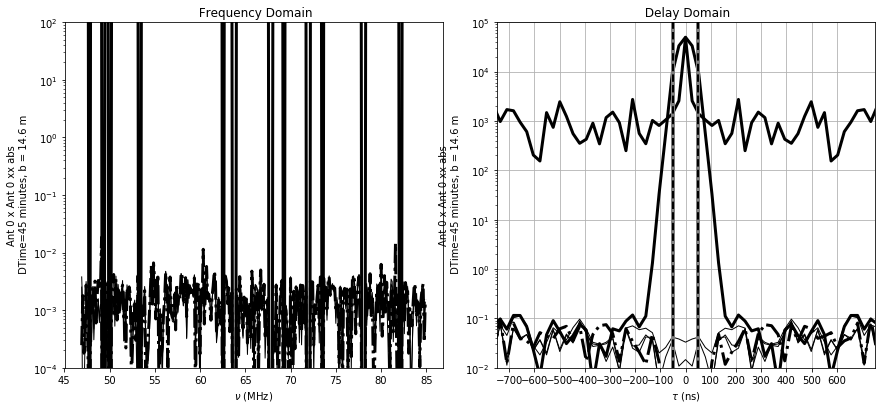

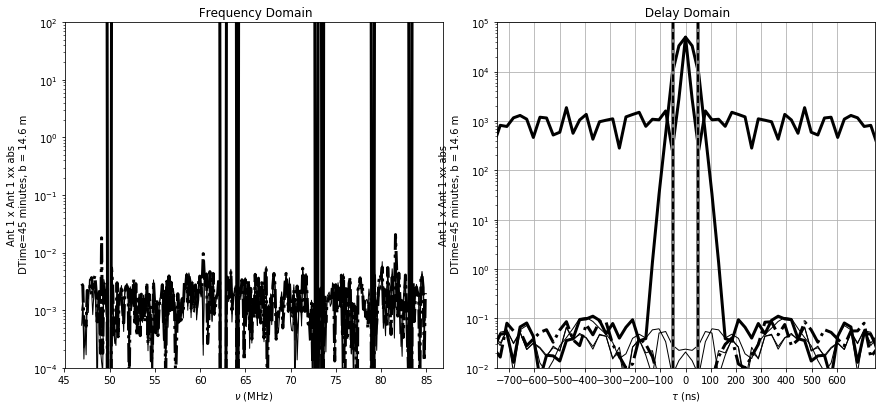

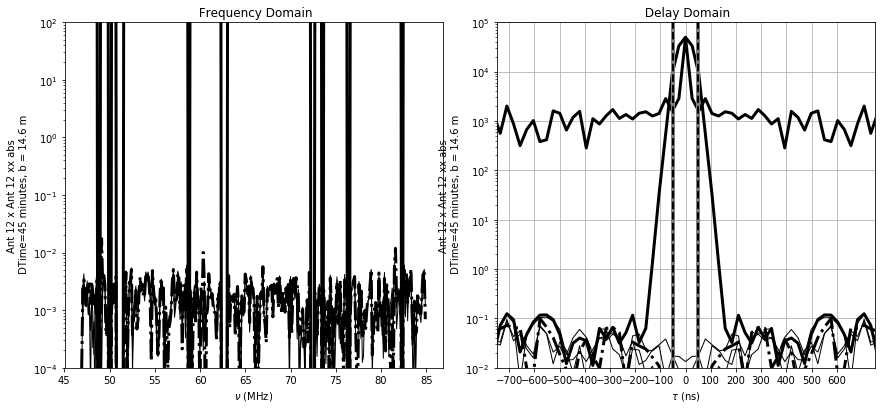

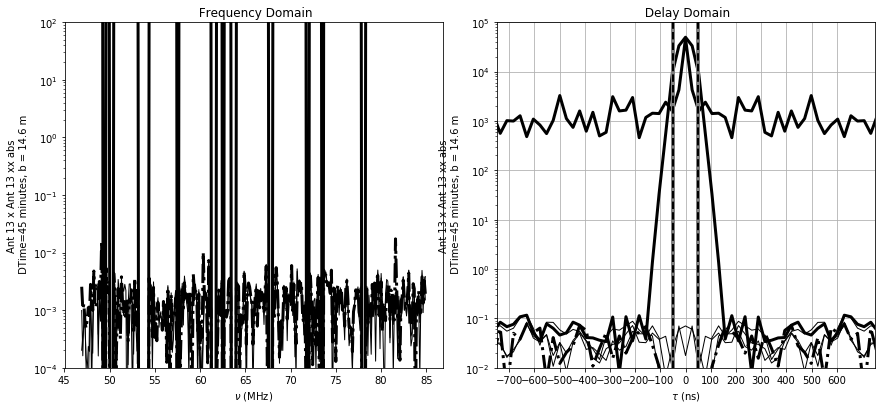

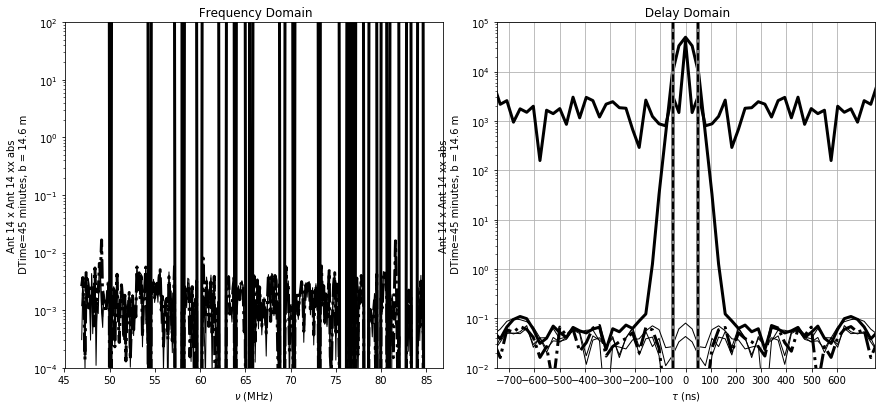

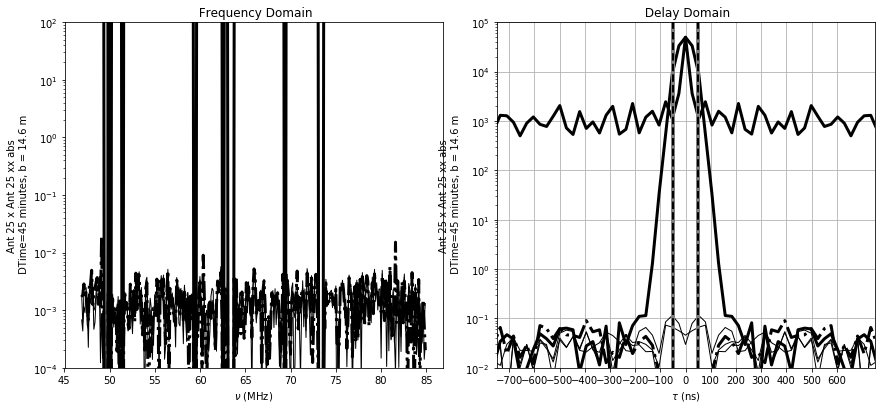

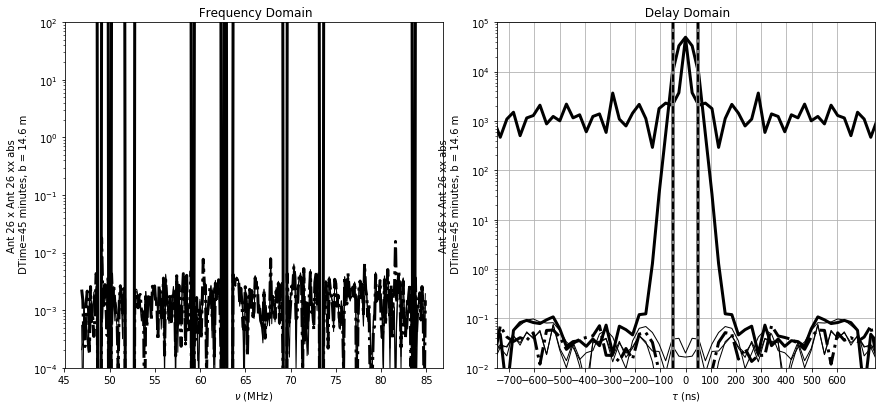

In [152]:
for antnum in np.unique(uvd.ant_1_array):
    for polnum in range(1):
        fig = plt.figure()
        axarr = [fig.add_axes([.1,.1,.35,.8]), fig.add_axes([.5,.1,.35,.8])]
        plt.sca(axarr[0])
        
        lineplot_filter(uvd_sim_low,uvd_sim_low_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='I',
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, avg_only=True)
        
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_only=True,
                              taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-5,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-7,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '-.')
        
        '''
        lineplot_filter(uvd_sim_low,uvd_sim_low_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-9,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '-.')
        
        #lineplot_filter(uvd_sim_low,uvd_sim_low_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
        #          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=4.*14.6,fg_eps=1e-9,
        #          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')
        
        plt.title(' Frequency Domain')
        plt.ylim(1e-4,1e2)
        plt.sca(axarr[1])
        
        lineplot_filter(uvd_sim_low,uvd_sim_low_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='I',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True)
        
        lineplot_filter(uvd_sim_low,uvd_sim_low_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='I',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                          taper='blackmanharris',domain='delay',quantity='abs',zero_flags=False)
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '--')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = ':', fg_eps = 1e-5)
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '-.', fg_eps = 1e-7)
        '''
        lineplot_filter(uvd_sim_low,uvd_sim_low_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                      taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '-.', fg_eps = 1e-9)
        
        #lineplot_filter(uvd_sim_low,uvd_sim_low_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
        #          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=4.*14.6,
        #          taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '--', fg_eps = 1e-9)
        plt.title(' Delay Domain')
        plt.ylim(1e-2,1e5)
        plt.xlim(-750,750)
        plt.xticks(np.arange(-700,700,100))
        plt.grid()
        plt.gcf().set_size_inches(15,6)
        #plt.ylim(0,1.75)
        plt.show()


In [153]:
np.save('2458465_low_validation_sim.npy',uvd_sim_low.data_array)
np.save('2458465_low__diff_validation_sim.npy',uvd_sim_low_diff.data_array)

## Is large delay structure caused by side-lobes or intrinsic structure?

My simulation results give me some confidence that the structure outside of the auto-corr horizon is indeed coming from real structures beyond the horizon. At a given delay, there are two possible sources of these structures 

1. Physical structure arising close to the reported delay. These can include reflections, resonances (which are technically reflections also) and any other intrinsic source of spectral structure. 

2. Side-lobes from strucutres at different delays. This is especially important with RFI flags which cause side-lobes to be very large. Since larger power tends to fall at low delays, this typically involves low-delay structure bleeding to high delay structure. 

How do we tell if structure at large delays is caused by side-lobes from lower delay contamination or is actually intrinsic spectral structure? This is an important question to ask since there are a number of significant RFI flags in the low-band auto-correlations, mostly caused by the DC charge pump. I now compare the delay-transform visibilities filtered at the dish scale, 300 ns, and 600 ns. 

In all of the dishes, there is clearly side-lobe contaminatino at large delays when only filtered at the dish scale (i.e. contaminating power just outside of the filter is bleading to large delays due to the RFI flagging) In many of the dishes, (0, 1, 25), the side-lobes no longer dominate after 300 ns have been subtracted away (300 ns agrees well with 600 ns) and significant power exists beyond 600 ns that is not associated with contaminating side-lobes. Antennas 12 and 26 have more side-lobe contamination.

Large delay structure in auto-correlations could very well be from the charge-pump spikes. __It is (see below)__

* __large delay structure remains above the noise level and is invariant after roughly 300 ns of filtering (it's real!). When less than 300 ns is used there is substantial contamination at large delays from sidelobes of contamination just outside of the horizon (filter region).__

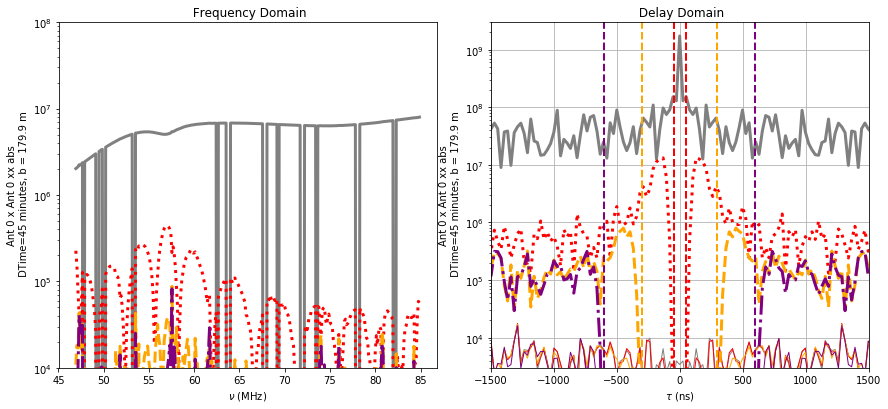

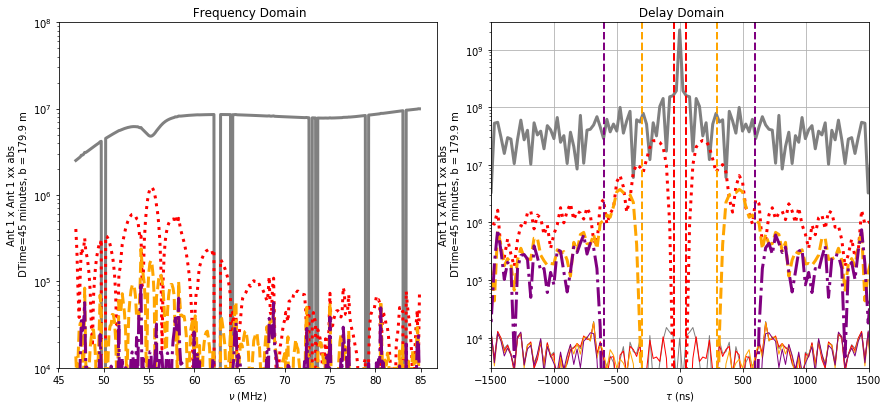

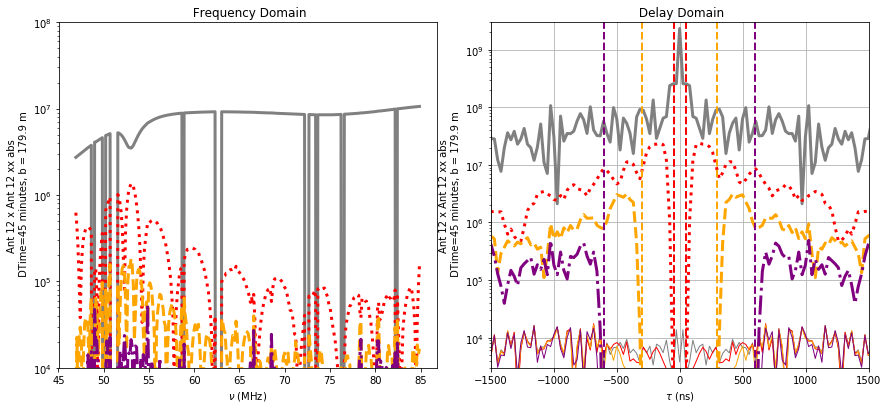

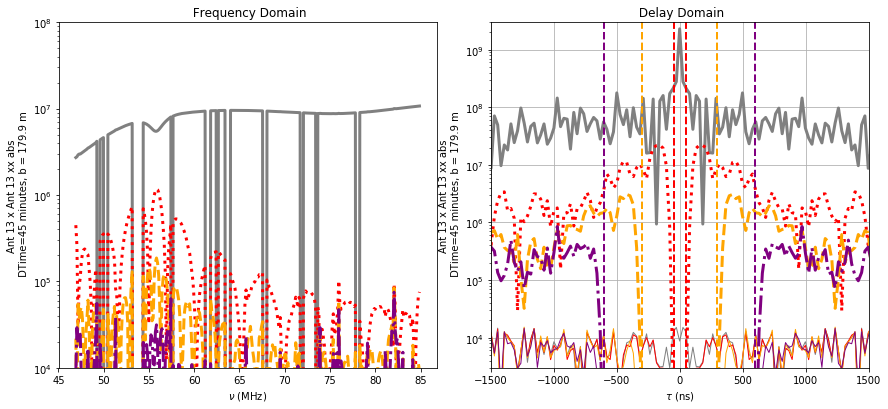

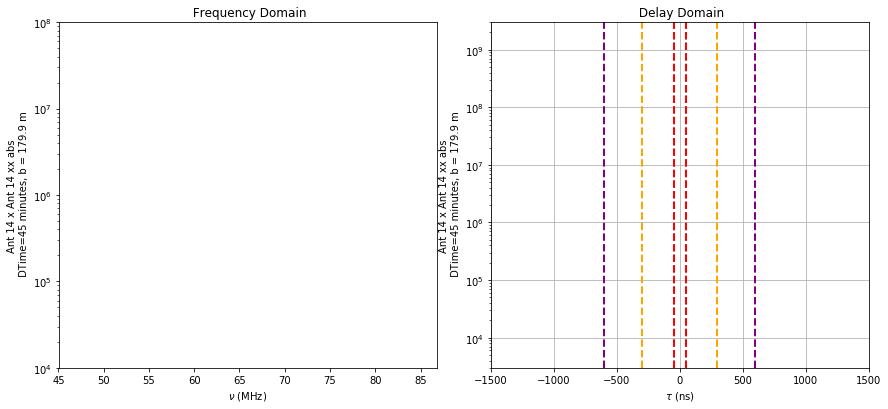

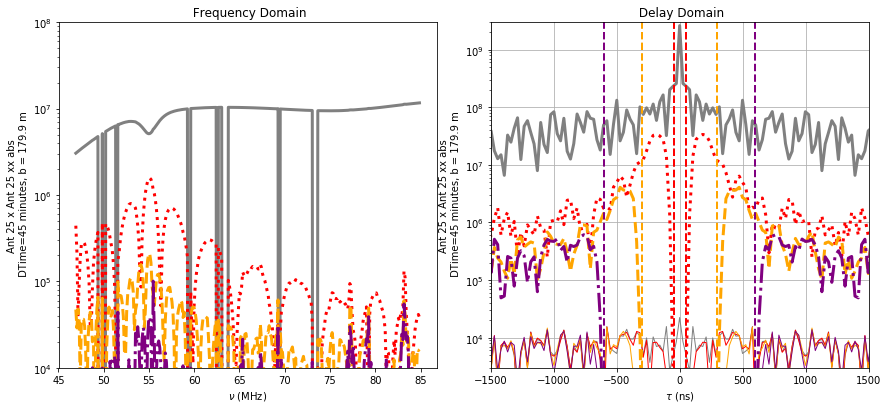

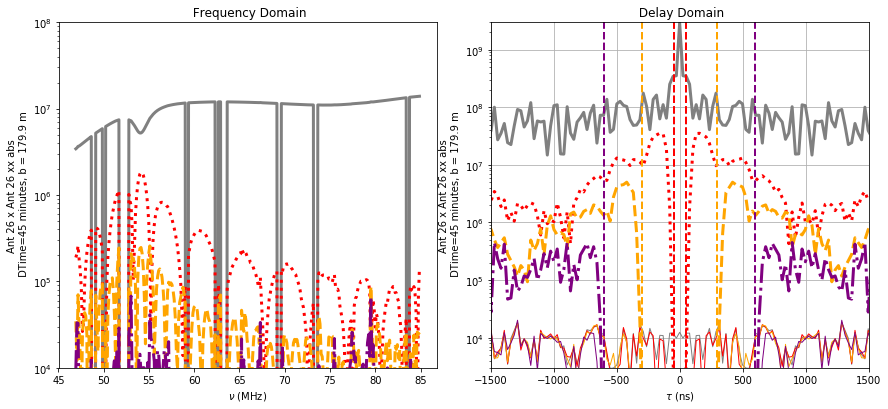

In [212]:
for antnum in np.unique(uvd.ant_1_array):
    for polnum in range(1):
        fig = plt.figure()
        axarr = [fig.add_axes([.1,.1,.35,.8]), fig.add_axes([.5,.1,.35,.8])]
        plt.sca(axarr[0])
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='I',
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'grey',
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, avg_only=True)
        
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_only=True,
                              taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-5,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                      fg_eps=1e-9, avg_color = 'red',
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')
        
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, 
                      dish_diam=SPEED_OF_LIGHT*300e-9, avg_color = 'orange',
                      fg_eps=1e-9, taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=2.*SPEED_OF_LIGHT*300e-9,
                      fg_eps=1e-9, avg_color = 'purple',
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '-.')

        
        plt.title(' Frequency Domain')
        plt.ylim(1e4,1e8)
        plt.sca(axarr[1])
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='I',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'grey',
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True)
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '--')
        '''
        
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'red',
                      taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = ':', fg_eps = 1e-9)
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=SPEED_OF_LIGHT*300e-9,
                              taper='boxcar',domain='delay',quantity='abs', avg_color = 'orange',
                              zero_flags=True, ls = '--', fg_eps = 1e-9)
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False,
                              dish_diam=2.*SPEED_OF_LIGHT*300e-9, avg_color = 'purple',
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '-.', fg_eps = 1e-9)
        
        
        plt.title(' Delay Domain')
        plt.ylim(3e3,3e9)
        plt.xlim(-1500,1500)
        #plt.xticks(np.arange(-1500,1500,100))
        plt.grid()
        plt.gcf().set_size_inches(15,6)
        #plt.ylim(0,1.75)
        plt.show()


## Excluding the divet: 

If we exclude the divet from our bandpass, then things look a lot nicer!
There is no residual ripple structure in the autocorrelations and the delay-residuals bottom out at the level of the charge-pump spikes. The dynamic range between the peak of the delay-spectrum of the autocorrelation is four orders of magnitude. Not bad but still not noise dominated.

* __When we do not include the diven in the delay-filtering bandpass, the large non-local ripple structures dissapear from our residual! The only limiting structure that appears to remain are the charge pump spikes! This means the the non-local structure is probably a side-lobe effect of the divet and can be mitigated by not including the divet in our analysis band!__

* __Charge pump spikes limit the dynamic range of autocorrelation delay-spectra__
* __The level of the charge-pump floor agrees with structure that remains in the delay spectra that include the divet after substantial filtering has been applied (floors agree).__

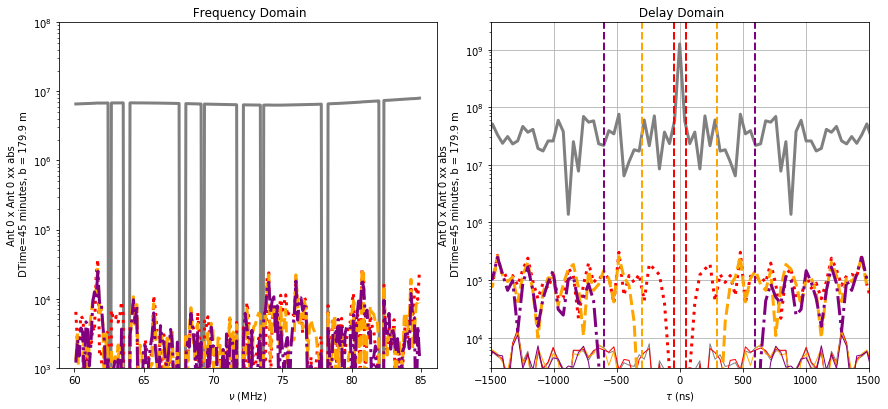

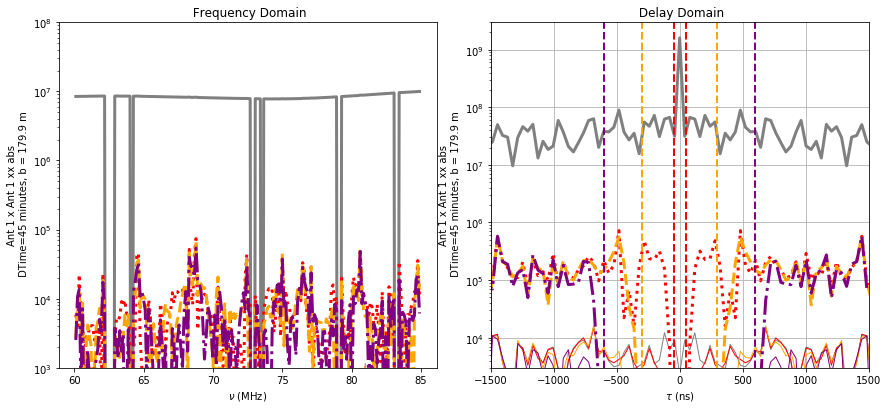

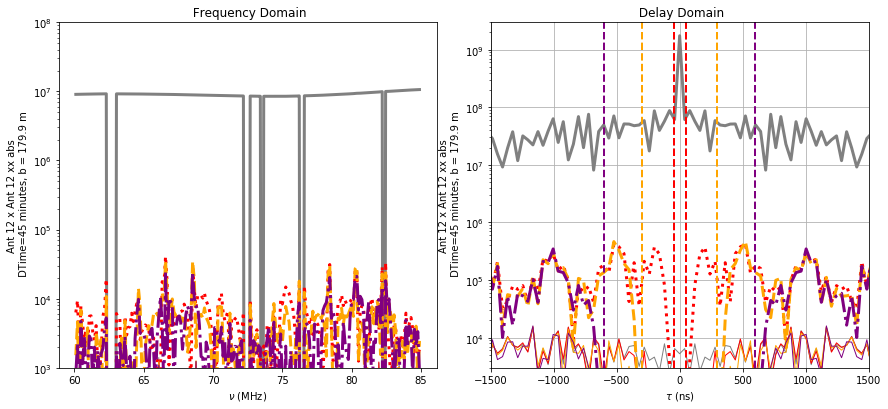

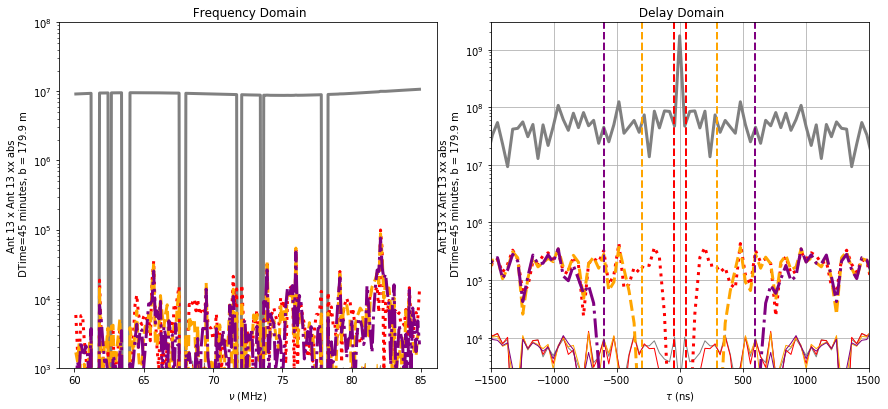

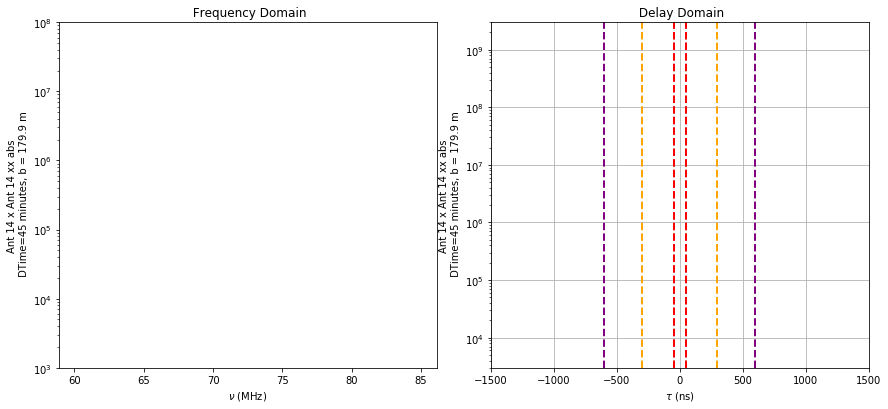

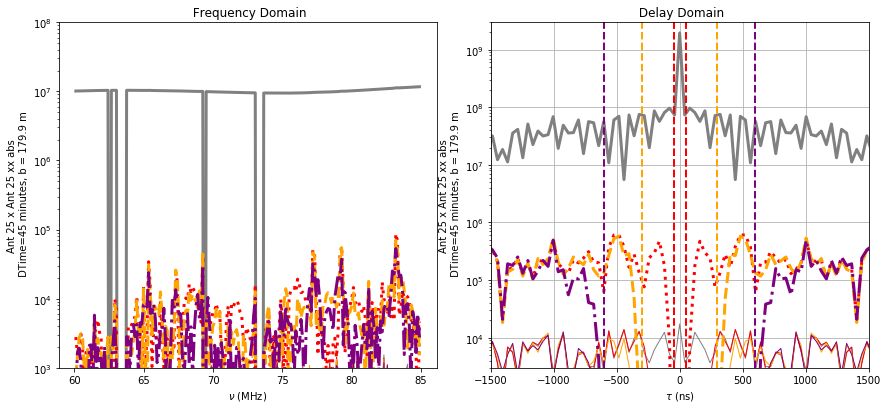

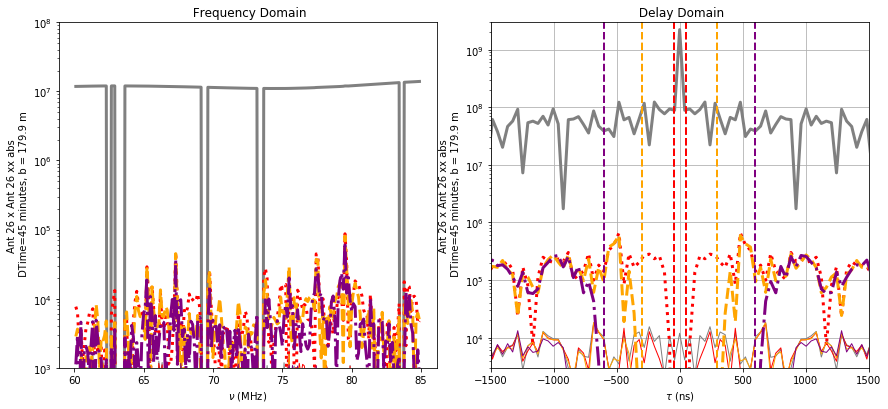

In [213]:
for antnum in np.unique(uvd.ant_1_array):
    for polnum in range(1):
        fig = plt.figure()
        axarr = [fig.add_axes([.1,.1,.35,.8]), fig.add_axes([.5,.1,.35,.8])]
        plt.sca(axarr[0])
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='I',
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                      taper='boxcar',domain='frequency',quantity='abs',
                      zero_flags=True, avg_only=True, avg_color = 'grey')
        
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_only=True,
                              taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-5,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'red',
                      fg_eps=1e-9,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')
        
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False,
                      dish_diam=SPEED_OF_LIGHT*300e-9, avg_color='orange',
                      fg_eps=1e-9, taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=2.*SPEED_OF_LIGHT*300e-9,
                      fg_eps=1e-9, avg_color = 'purple',
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '-.')

        
        plt.title(' Frequency Domain')
        plt.ylim(1e3,1e8)
        plt.sca(axarr[1])
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='I',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False,
                              dish_diam=14.6, taper='boxcar',avg_color = 'grey',
                              domain='delay',quantity='abs',zero_flags=True)
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '--')
        '''
        
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'red',
                      taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = ':', fg_eps = 1e-9)
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False,
                              dish_diam=SPEED_OF_LIGHT*300e-9, avg_color = 'orange',
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '--', fg_eps = 1e-9)
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                              flag_across_time=True,renormalize=False,mean_norm=False, 
                              dish_diam=2.*SPEED_OF_LIGHT*300e-9, avg_color = 'purple',
                              taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '-.', fg_eps = 1e-9)
        
        
        plt.title(' Delay Domain')
        plt.ylim(3e3,3e9)
        plt.xlim(-1500,1500)
        #plt.xticks(np.arange(-1500,1500,100))
        plt.grid()
        plt.gcf().set_size_inches(15,6)
        #plt.ylim(0,1.75)
        plt.show()


## Verify that the residuals outside of the divet are dominated by charge pump spikes and their side-lobes. 

To illustrate how the charge spikes are source of the floor in delay-structure on the autocorrelations, we re-inspect the band outside of the divet and compare filtered versus unfiltered data where the unfiltered data is translated up to the level of the unfiltered autocorrelations and scaled up by a factor of 10 to demonstrate the existence of the divets. We see that the same spikes that limit the structure in the above plots line up exactly with the autcorrelation spikes. 

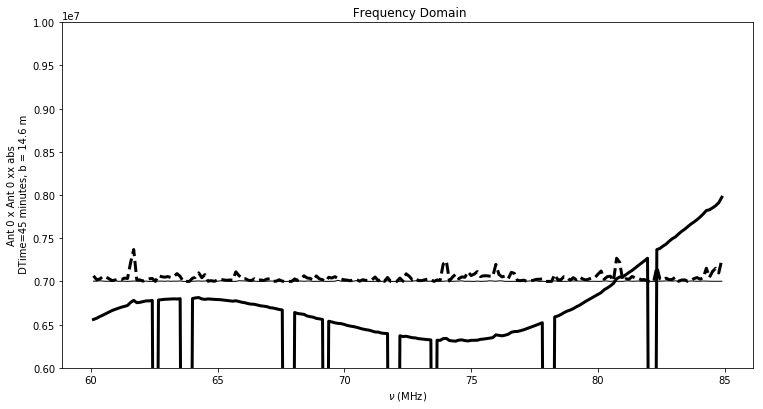

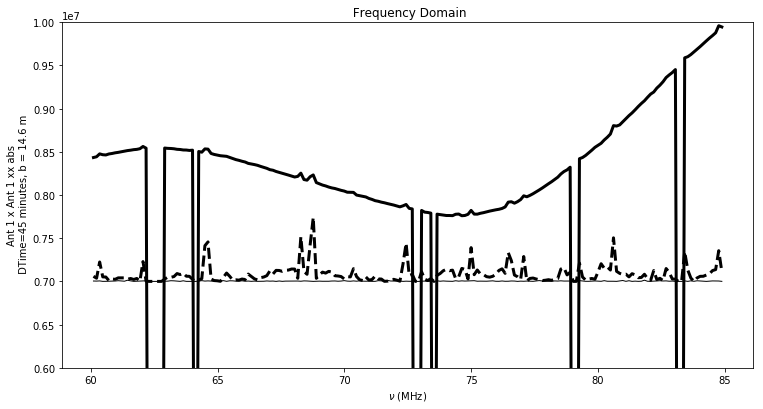

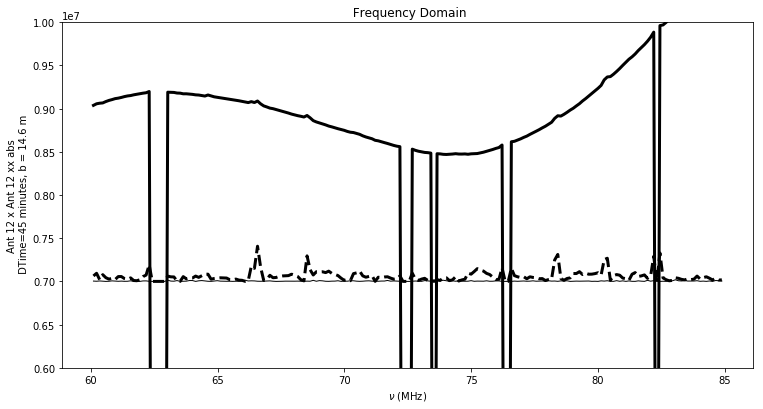

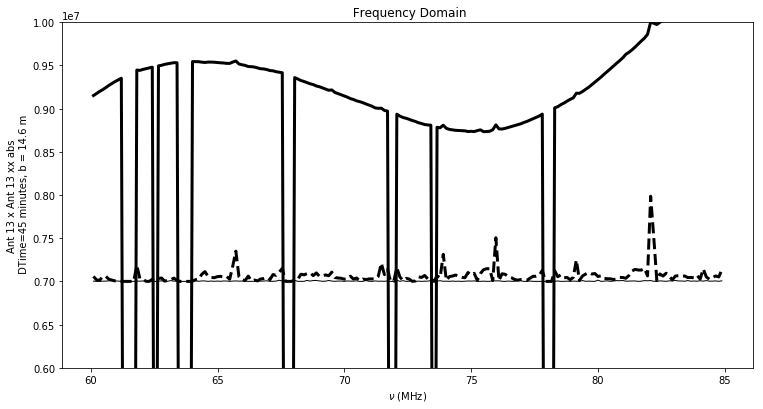

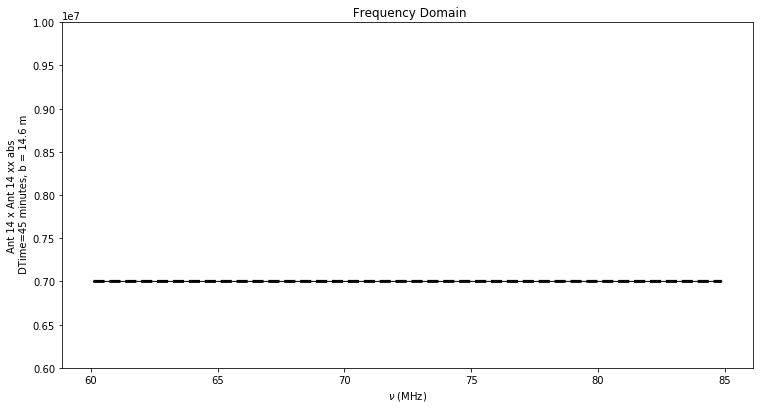

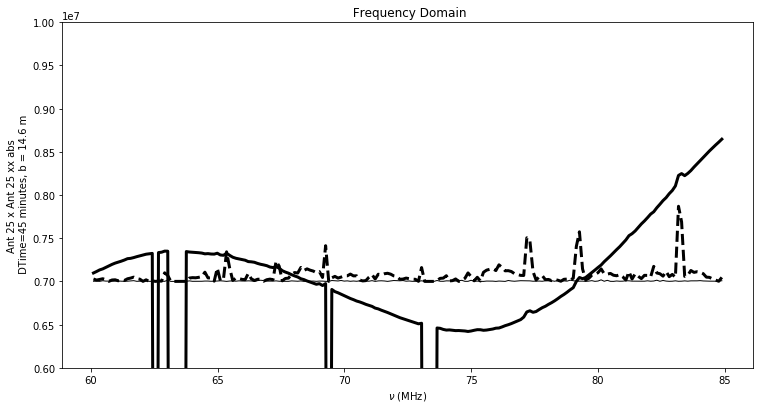

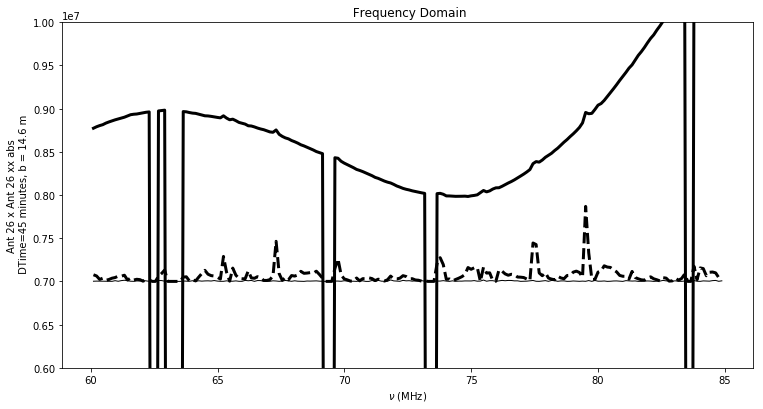

In [205]:
translation_full = [0. for a in np.unique(uvd.ant_1_array)]
translation_full[-1] = -3e6
translation_full[-2] = -3e6
for aind, antnum in enumerate(np.unique(uvd.ant_1_array)):
    for polnum in range(1):
        fig = plt.figure()
        axarr = [fig.add_axes([.1,.1,.8,.8])]
        plt.sca(axarr[0])
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=False,weights='I',
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                      y_translate = translation_full[aind],
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, avg_only=True)
        
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',
                              flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_only=True,
                              taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-5,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=False,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                      fg_eps=1e-9, y_translate = 7e6, y_scale = 10.,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')
        
        '''
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=SPEED_OF_LIGHT*300e-9,
                      fg_eps=1e-9, taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')
        
        lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                      flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=2.*SPEED_OF_LIGHT*300e-9,
                      fg_eps=1e-9,
                      taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '-.')

        '''
        plt.title(' Frequency Domain')
        plt.ylim(6e6,1e7)
        plt.gcf().set_size_inches(12,6)
        plt.show()


### So are the non local ripply structures we are seeing just side-lobes of the divet in frequency space after performing the delay-filtering? Maybe things aren't as bad as I originally thought!

## Low-Band Cross-correlations

I now inspect the cross correlations in both the delay and frequency domains. I identify several take aways in the below plots. 
 
 * There is a periodic structure in the cross correlations that is 3-5 MHz (roughly 200-250 ns). There appear to be 200 ns peaks in the delay-visibilities which correspond to this structure. The Structure peaks at the frequency of the divet (55 MHz) and falls with increasing frequency.
 
     1. Super-horizon emission that is localized in frequency
     2. Super-horizon emission that is not localized in frequency and side-lobes that show up over the broad band. 
  
 
In both options, very high delay super-horizon structure can be caused by intrinsic structure or side-lobes in the delay domain of super-horizon emission that is at relatively low delays and larger amplitudes.

#### Plots

Each panel shows, for each XX correlation, the absolute value of, left: frequency domain cross-correlations, right: delay-domain cross correlations. Different line styles represent various levels of delay-filtering (with and adjusted filter window width). The width of each filter is illustrated by vertical solid grey lines and dashed vertical black lines.

Moving the filter from the horizon (red dotted line) to the horizon plus 300 ns (orange dashed line) yields considerable disagreement which suggests that the horizon + 300 ns structure in the red dotted line is sidelobe dominated. For most of our baselines, this does not happen when we move from 300 ns to 600 ns -- suggesting that the structure we are seeing really is physical (not a side-lobe effect). 

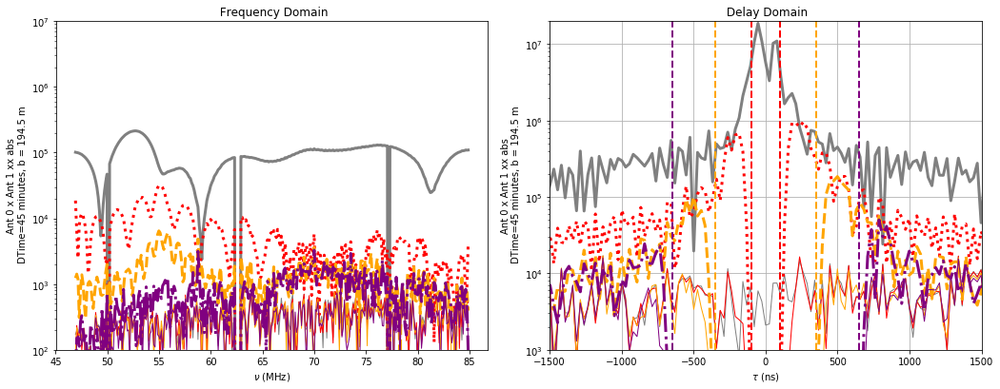

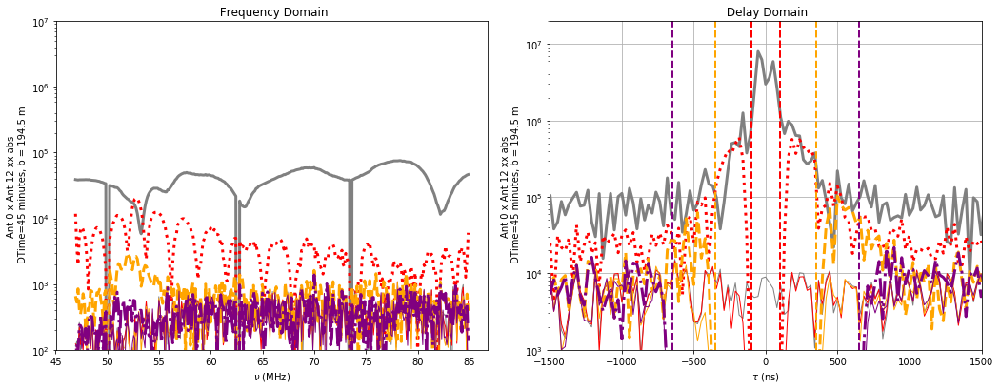

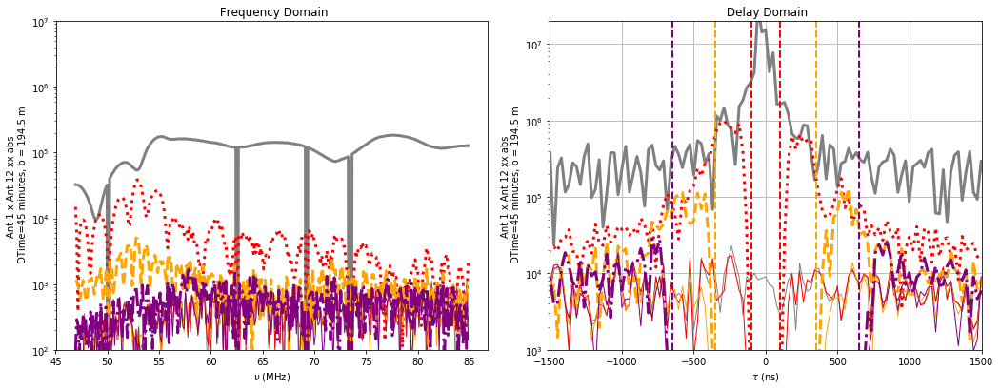

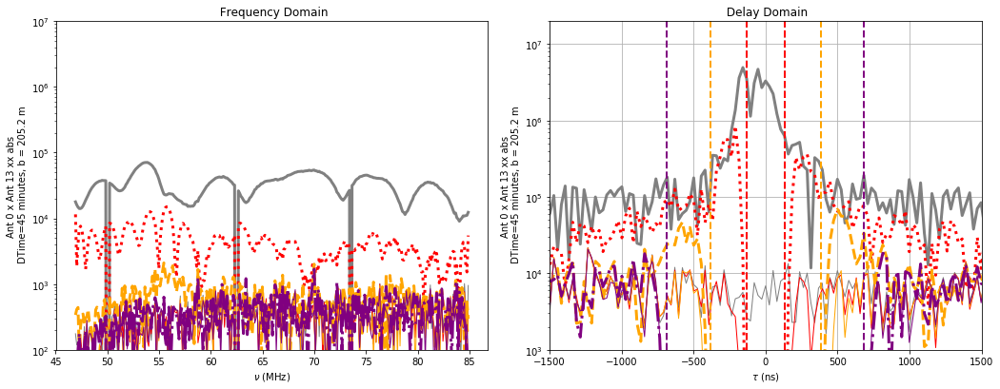

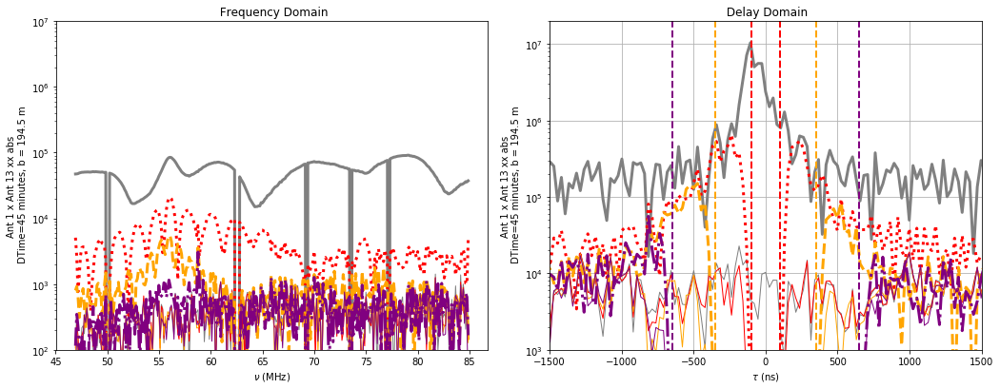

...

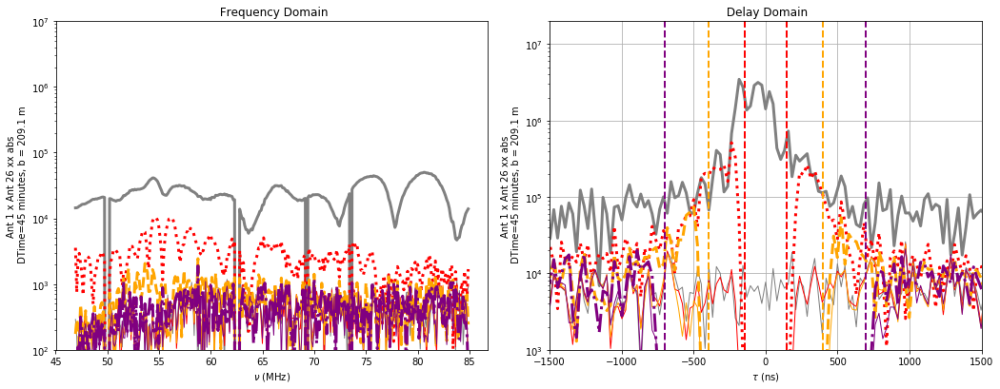

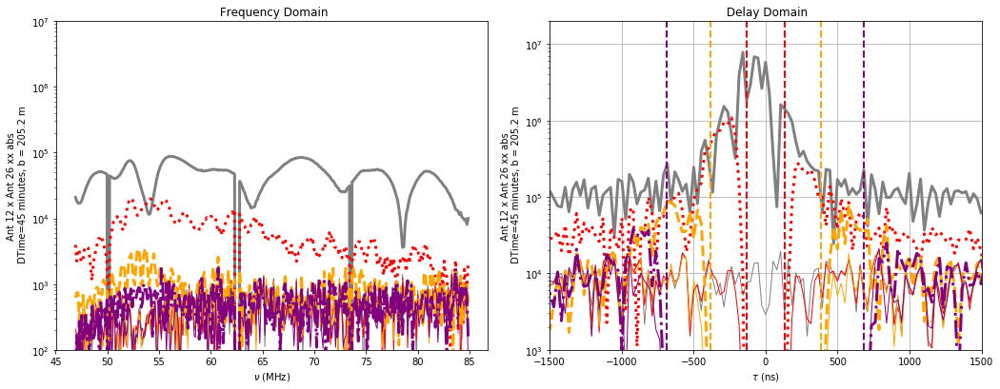

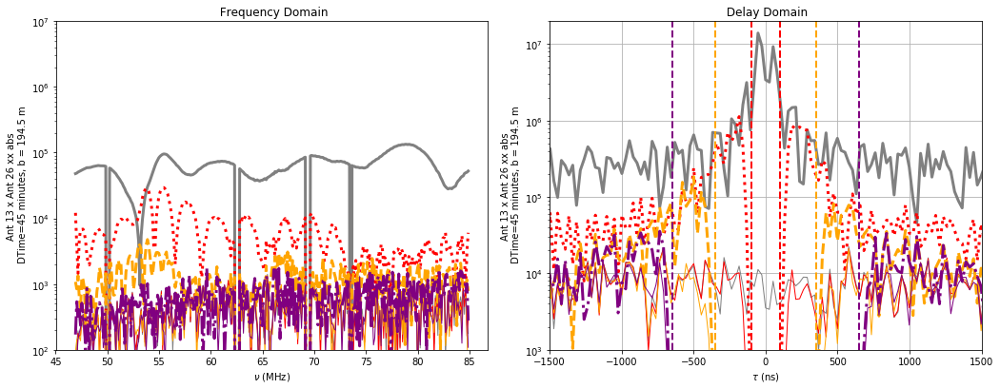

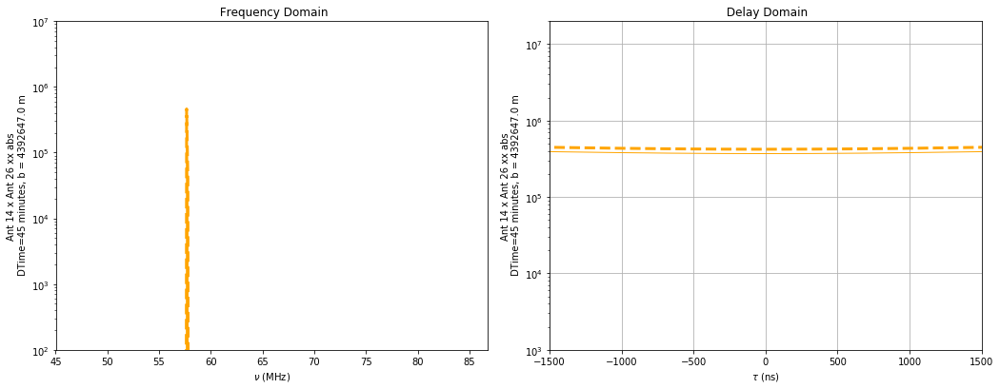

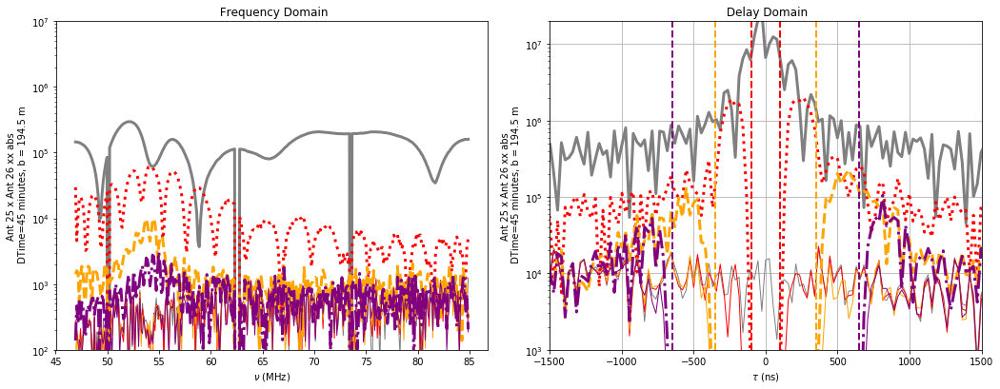

In [214]:
ants = np.unique(uvd.ant_1_array)
for antnum2 in ants:
    antind2 = np.where(antnum2==ants)[0][0]
    for antind1 in range(antind2):
        antnum1 = ants[antind1]
        for polnum in range(1):
            fig = plt.figure()
            axarr = [fig.add_axes([.1,.1,.35,.8]), fig.add_axes([.5,.1,.35,.8])]
            plt.sca(axarr[0])
            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='I',
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'grey',
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, avg_only=True)

            '''
            lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',
                                  flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_only=True,
                                  taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')

            lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-5,
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')
            '''
            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'red',
                          fg_eps=1e-9,
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')


            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, 
                          dish_diam=SPEED_OF_LIGHT*300e-9, avg_color = 'orange',
                          fg_eps=1e-9, taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')

            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=2.*SPEED_OF_LIGHT*300e-9,
                          fg_eps=1e-9, avg_color = 'purple',
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '-.')


            plt.title(' Frequency Domain')
            plt.ylim(1e2,1e7)
            plt.sca(axarr[1])

            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='I',avg_only=True,
                                  flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'grey',
                                  taper='boxcar',domain='delay',quantity='abs',zero_flags=True)
            '''
            lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                                  flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                                  taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '--')
            '''


            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'red',
                          taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = ':', fg_eps = 1e-9)

            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                                  flag_across_time=True,renormalize=False,mean_norm=False, 
                                  dish_diam=SPEED_OF_LIGHT*300e-9, avg_color = 'orange',
                                  taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '--', fg_eps = 1e-9)

            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                                  flag_across_time=True,renormalize=False,mean_norm=False, 
                                  dish_diam=2.*SPEED_OF_LIGHT*300e-9, avg_color = 'purple',
                                  taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '-.', fg_eps = 1e-9)


            plt.title(' Delay Domain')
            plt.ylim(1e3,2e7)
            plt.xlim(-1500,1500)
            #plt.xticks(np.arange(-1500,1500,100))
            plt.grid()
            plt.gcf().set_size_inches(18,6)
            #plt.ylim(0,1.75)
            plt.show()


## Visibilities outside of the divet. 

Now let's inspect the region outside of the divet. 

This is wierd! When we exclude the divet (60-85 MHz), __a region that did not appear to have super-horizon emission aside from teh charge spikes__ there is suddenly more super-horizon structure that wasn't apparent in the autocorrelations!

__Why is there super-horizon structure that appears in the cross correlations but not in the auto correlations?__

__The super-horizon emission isn't that far down, only roughly an order of magnitude (compared to at least 4 orders of magnitude in the auto-correlations)__. 

__hypotheses__

1. Since the charge spikes are weaker in the cross correlations (if they exist at all), they don't mask any spectral structure. 
2. There is a large smooth noise bias in the autocorrelations that masks reflections.
3. Both of the above?
4. This isn't cross-tolk or a reflection problem at all? 
5. All of the above?


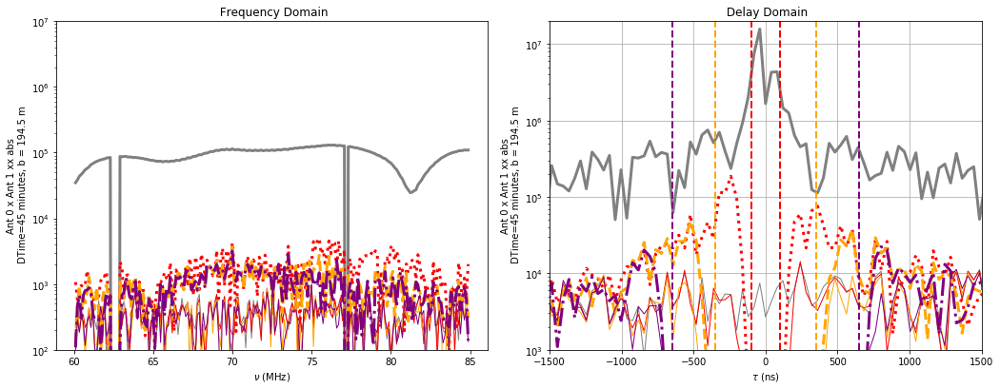

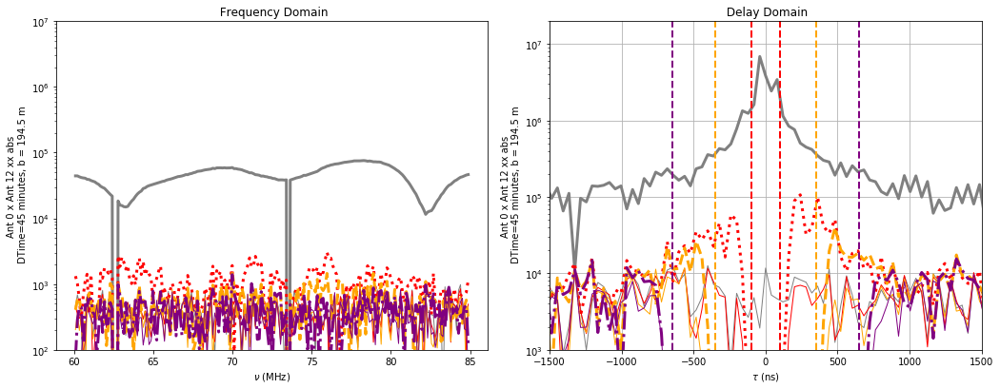

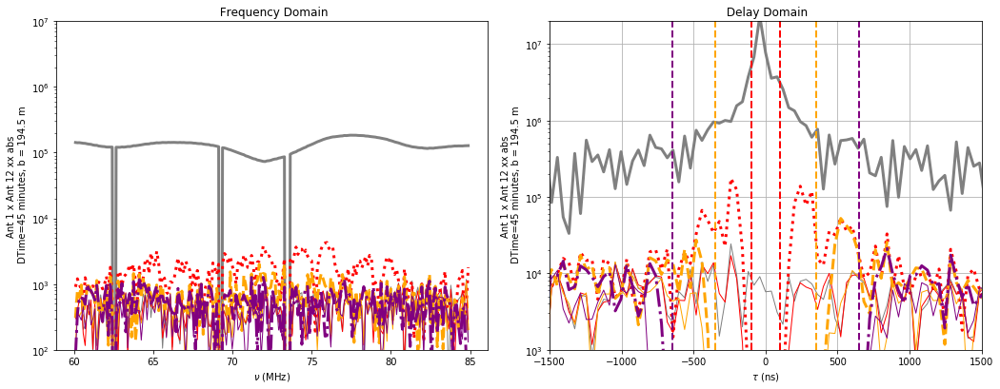

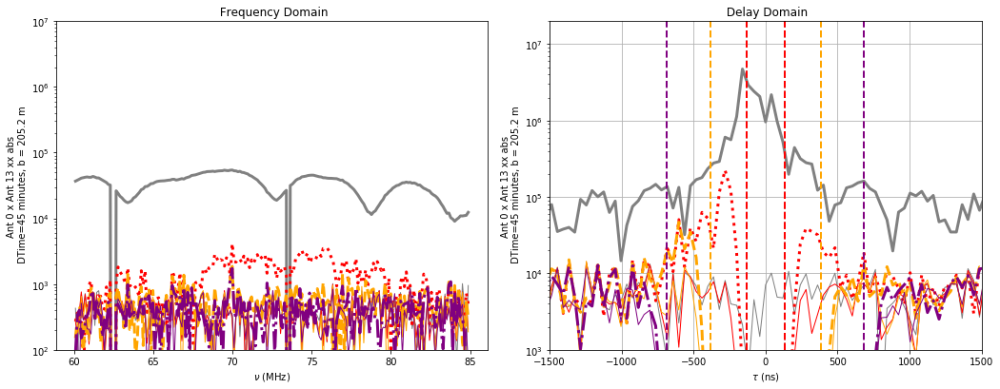

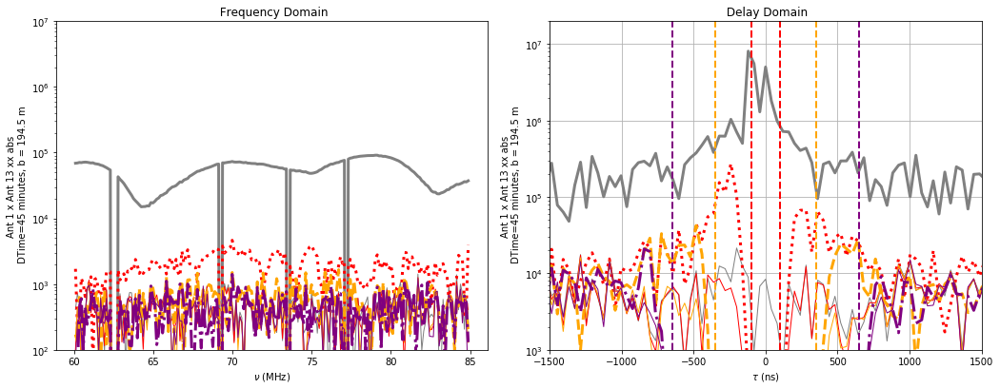

...

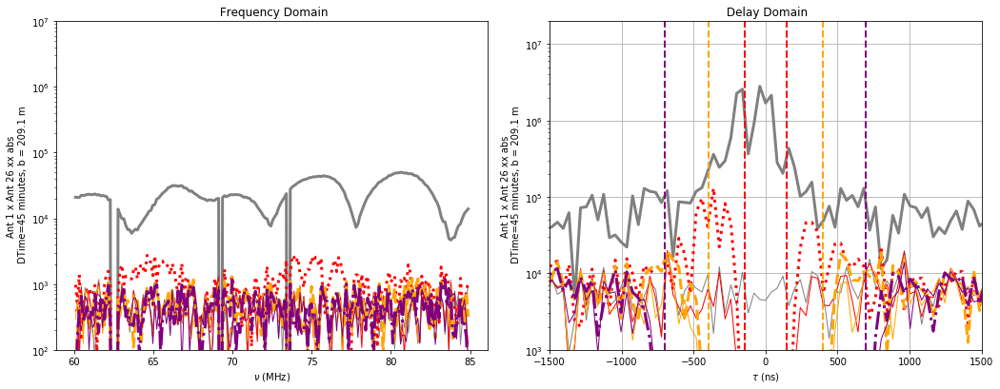

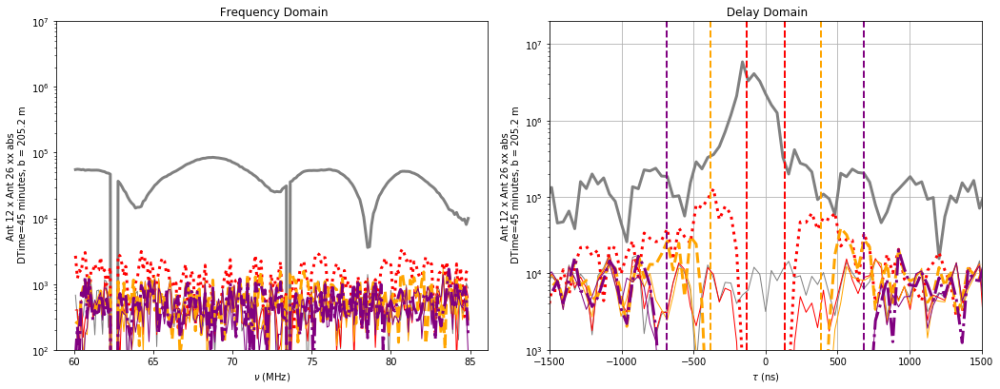

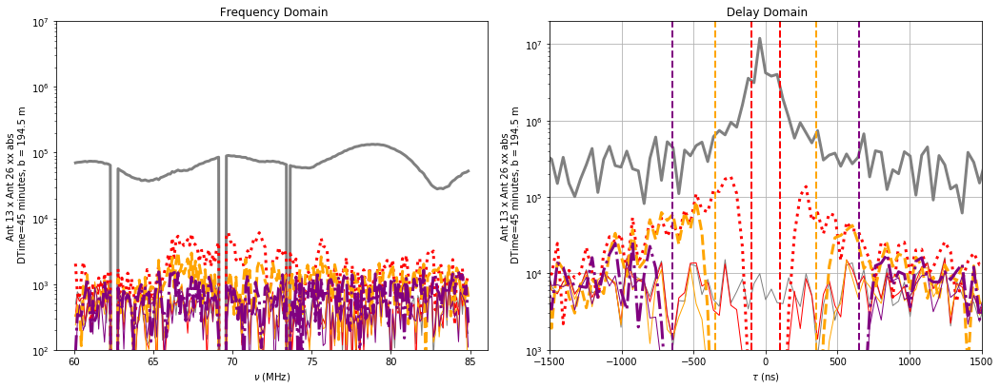

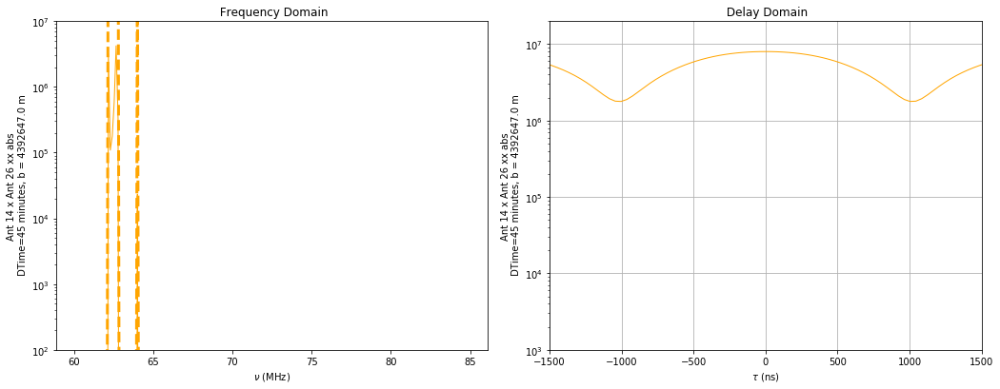

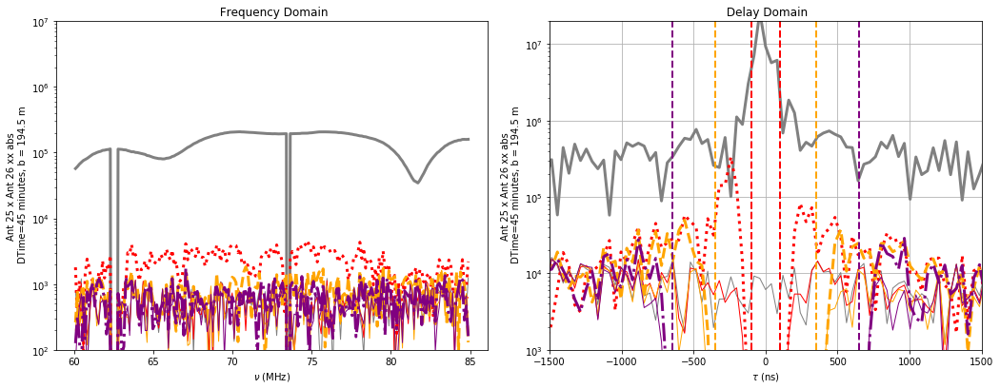

In [215]:
ants = np.unique(uvd.ant_1_array)
for antnum2 in ants:
    antind2 = np.where(antnum2==ants)[0][0]
    for antind1 in range(antind2):
        antnum1 = ants[antind1]
        for polnum in range(1):
            fig = plt.figure()
            axarr = [fig.add_axes([.1,.1,.35,.8]), fig.add_axes([.5,.1,.35,.8])]
            plt.sca(axarr[0])
            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='I',
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'grey',
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, avg_only=True)

            '''
            lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',
                                  flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_only=True,
                                  taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')

            lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-5,
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')
            '''
            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'red',
                          fg_eps=1e-9,
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')


            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, 
                          dish_diam=SPEED_OF_LIGHT*300e-9, avg_color = 'orange',
                          fg_eps=1e-9, taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')

            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=2.*SPEED_OF_LIGHT*300e-9,
                          fg_eps=1e-9, avg_color = 'purple',
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '-.')


            plt.title(' Frequency Domain')
            plt.ylim(1e2,1e7)
            plt.sca(axarr[1])

            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='I',avg_only=True,
                                  flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'grey',
                                  taper='boxcar',domain='delay',quantity='abs',zero_flags=True)
            '''
            lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                                  flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,
                                  taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '--')
            '''


            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_color = 'red',
                          taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = ':', fg_eps = 1e-9)

            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                                  flag_across_time=True,renormalize=False,mean_norm=False, 
                                  dish_diam=SPEED_OF_LIGHT*300e-9, avg_color = 'orange',
                                  taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '--', fg_eps = 1e-9)

            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                                  flag_across_time=True,renormalize=False,mean_norm=False, 
                                  dish_diam=2.*SPEED_OF_LIGHT*300e-9, avg_color = 'purple',
                                  taper='boxcar',domain='delay',quantity='abs',zero_flags=True, ls = '-.', fg_eps = 1e-9)


            plt.title(' Delay Domain')
            plt.ylim(1e3,2e7)
            plt.xlim(-1500,1500)
            #plt.xticks(np.arange(-1500,1500,100))
            plt.grid()
            plt.gcf().set_size_inches(18,6)
            #plt.ylim(0,1.75)
            plt.show()


### Compare location of spikes in autocorrelations to locations of spikes in cross correlations.

In [ ]:
Are there reflection spikes 

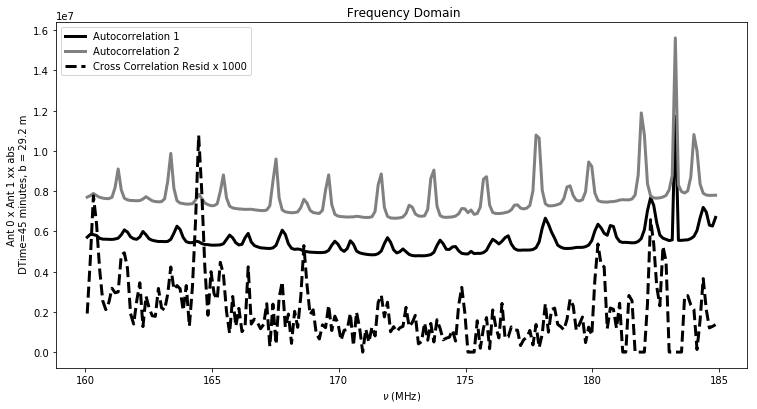

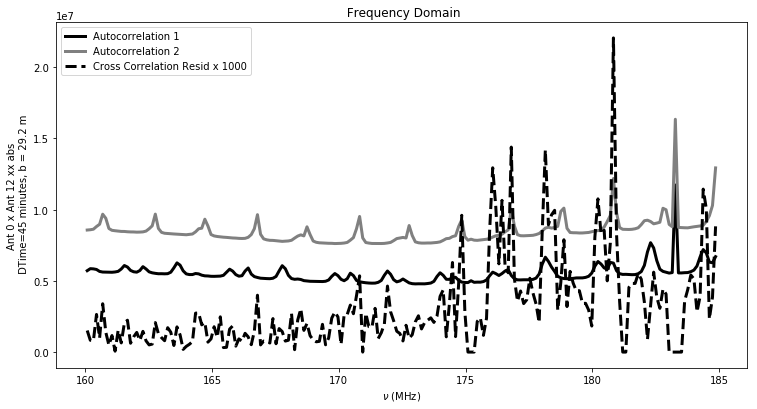

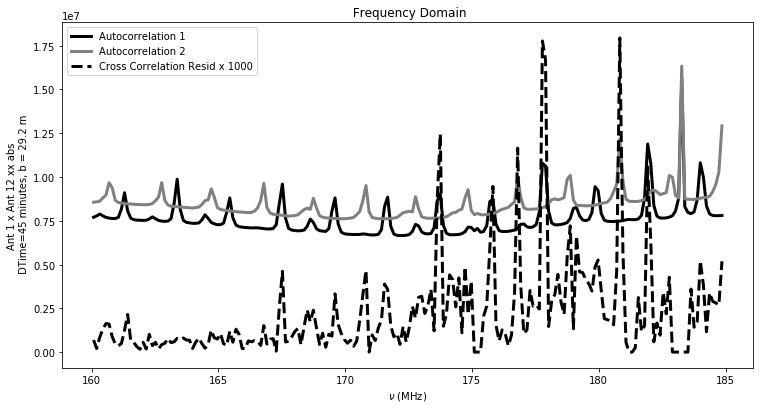

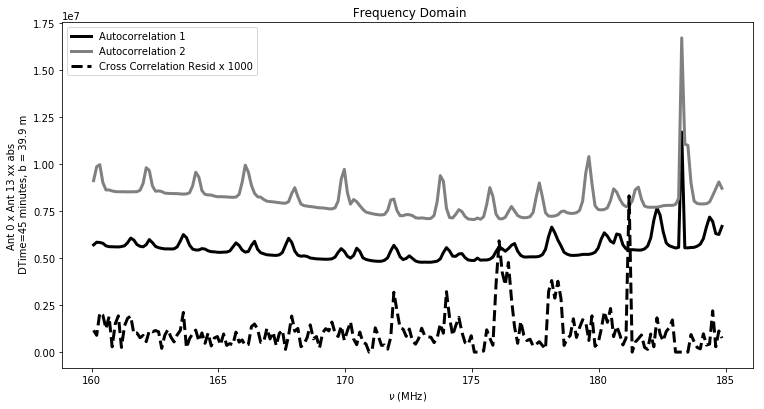

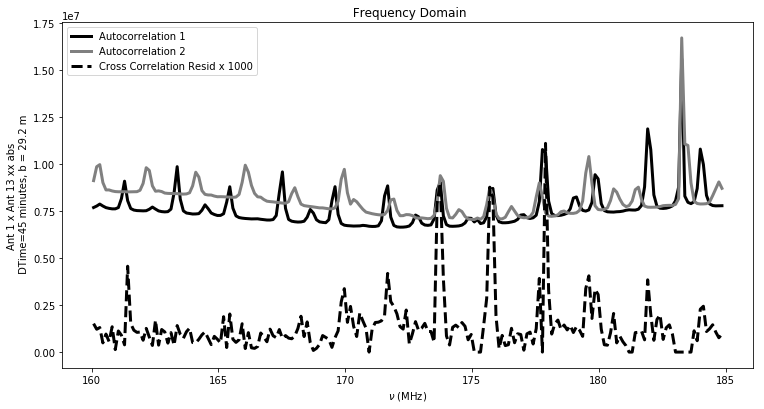

...

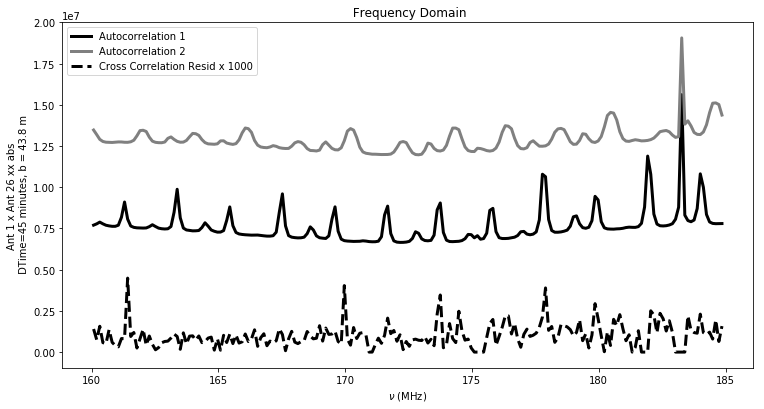

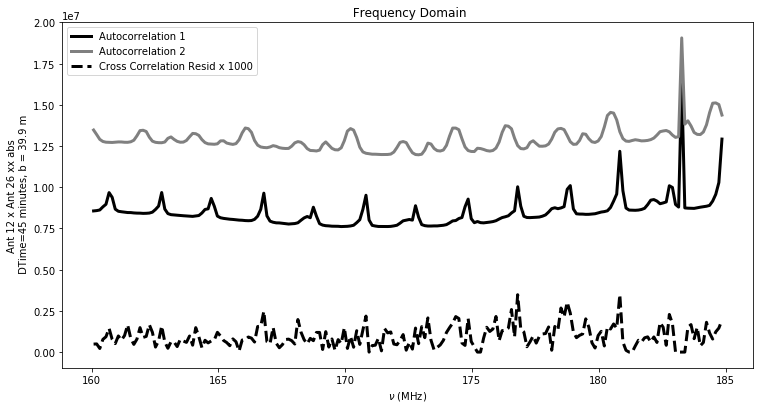

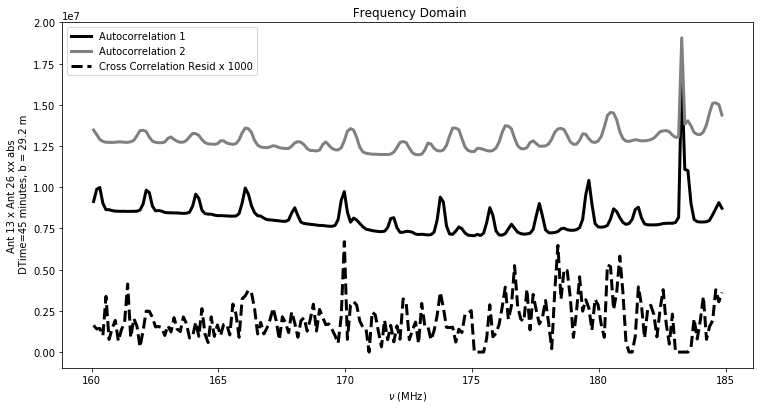

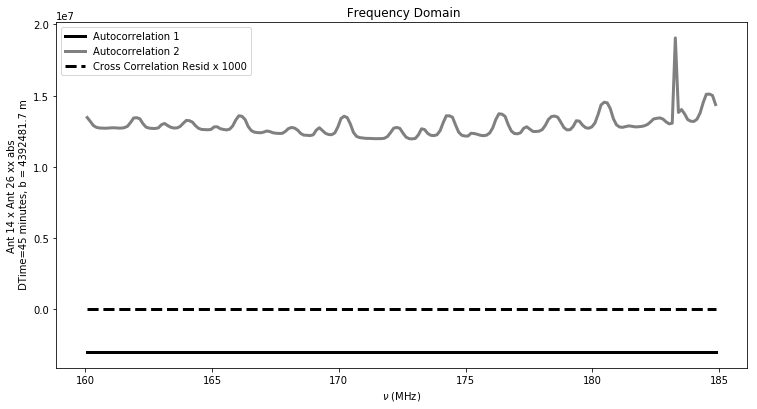

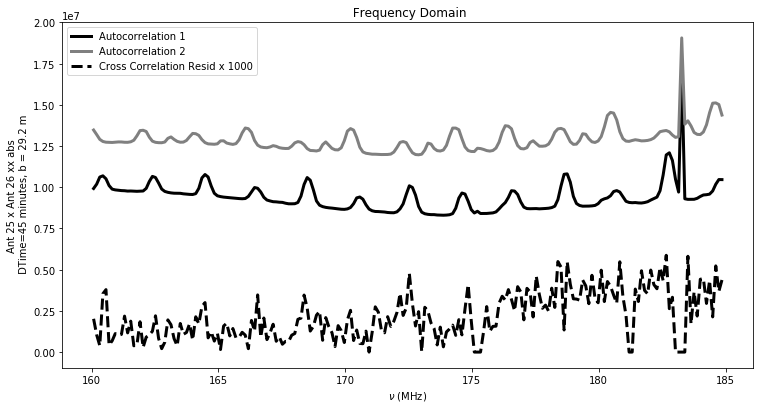

In [228]:
translation_full = [0. for a in np.unique(uvd.ant_1_array)]
translation_full[-1] = -3e6
translation_full[-2] = -3e6
ants = np.unique(uvd.ant_1_array)
for antnum2 in ants:
    antind2 = np.where(antnum2==ants)[0][0]
    for antind1 in range(antind2):
        antnum1 = ants[antind1]
        for polnum in range(1): 
            fig = plt.figure()
            axarr = [fig.add_axes([.1,.1,.8,.8])]
            plt.sca(axarr[0])

            lineplot_filter(uvd,uvd_diff,antnum1,antnum1,polnum,fmin=160e6,fmax=185e6,logscale=False,weights='I',
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, show_diff = False,
                          y_translate = translation_full[aind], avg_label = 'Autocorrelation 1',
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=False, avg_only=True)

            lineplot_filter(uvd,uvd_diff,antnum2,antnum2,polnum,fmin=160e6,fmax=185e6,logscale=False,weights='I',
                  flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, show_diff = False,
                  y_translate = translation_full[aind], avg_color = 'grey', avg_label = 'Autocorrelation 2',
                  taper='boxcar',domain='frequency',quantity='abs',zero_flags=False, avg_only=True)
            '''
            lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',
                                  flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, avg_only=True,
                                  taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')

            lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=45e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6,fg_eps=1e-5,
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = ':')
            '''
            lineplot_filter(uvd,uvd_diff,antnum1,antnum2,polnum,fmin=160e6,fmax=185e6,logscale=False,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=14.6, show_diff = False,
                          fg_eps=1e-9, y_translate = 0, y_scale = 1000., avg_label = 'Cross Correlation Resid x 1000',
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')

            '''
            lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=SPEED_OF_LIGHT*300e-9,
                          fg_eps=1e-9, taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '--')

            lineplot_filter(uvd,uvd_diff,antnum,antnum,polnum,fmin=60e6,fmax=85e6,logscale=True,weights='WTL',avg_only=True,
                          flag_across_time=True,renormalize=False,mean_norm=False, dish_diam=2.*SPEED_OF_LIGHT*300e-9,
                          fg_eps=1e-9,
                          taper='boxcar',domain='frequency',quantity='abs',zero_flags=True, ls = '-.')

            '''
            plt.legend()
            plt.title(' Frequency Domain')
            #plt.ylim(6e6,2e7)
            plt.gcf().set_size_inches(12,6)
            plt.show()
